In [2]:
from __future__ import annotations

import jax.numpy as jnp
import qutip as qt
import numpy as np
import dynamiqs as dq
import scqubits as scq
import matplotlib.pyplot as plt
from parameters import DeviceParameters, PulseParameters
from hamiltonian import operators


CREATING THE SEMI-CLASSICAL HAMILTONIAN.

In [2]:
3.0900705340709207/2/np.pi

0.4918

In [3]:
def qubit_drive_strength( Omega_d: float):
    ## Paper parameters just for testing
    
    Ej = 45.867252742410976/2/np.pi
#Ec = 0.73032 #/2/pi
    Ec = 5.7805304826052195/2/np.pi
#El = 0.55097 #/2/pi
    El = 3.0900705340709207/2/np.pi
    phi_ext = 0.5 #*2*pi
    flx = scq.Fluxonium(Ej,Ec,El,phi_ext,cutoff = 1000, truncated_dim=20)
    H_fluxonium_bare = flx.hamiltonian(energy_esys=True)
    n_fluxonium = flx.n_operator(energy_esys=True)
    phi_fluonium = flx.phi_operator(energy_esys=True)
    #ops = operators(params, pulse)
    n_l = 5 # levels of the parasitic mode to be considered.
    I_nue = dq.eye(n_l)
    I_phi = dq.eye(20, layout = dq.dia)
    omega_nue = 12.06 #* (2 * np.pi) ## frequency of the first array mode.
    g_phi_r = 25.50*  1e-3 ## coupling between qubit and resonator.
    g_nue_r = 8.45 * 1e-3 ## coupling between array and resonator.
    g_phi_nue = 315 * 1e-3 ## coupling betwwen array and qubit.

    ## Wrapping the angle to preserve periodicity
    def wrap_angle(theta):
        return jnp.mod(theta, 2 * jnp.pi)

    #a = ops["a"]
    #print(ops["n"])
    #a_dag = a.dag()
    a_phi_ = dq.destroy(20)
    a_phi_dag_ = a_phi_.dag()
    a_phi = dq.tensor(a_phi_, I_nue)
    a_phi_dag = a_phi.dag()
    n_phi = a_phi_dag @ a_phi
    N_phi_zpf = 0.36
    # N_phi = dq.tensor((1j) * N_phi_zpf* ops["n_f"], I_nue)
    N_phi = dq.tensor(n_fluxonium, I_nue)
    print(n_fluxonium.shape)


    a_nue = dq.destroy(n_l)
    a_dag_nue = a_nue.dag()

    a_nue_ = dq.tensor(I_phi, a_nue)
    a_dag_nue_ = dq.tensor(I_phi, a_dag_nue)
    n_nue = a_dag_nue_ @ a_nue_

    N_nue_zpf = 1.58
    N_nue_ = (1j)*N_nue_zpf*(a_dag_nue - a_nue)
    N_nue = dq.tensor(I_phi, (1j)*N_nue_zpf*(a_dag_nue - a_nue))
    print(N_nue.shape)

    n_r_list = jnp.arange(0, 50, 1)
    omega_d = Omega_d #* (2 * np.pi)

    epsilon_phi_r_1 = 2 * g_phi_r * jnp.sqrt (1)
    epsilon_nue_r_1 = 2 * g_nue_r * jnp.sqrt (1)

    def coeff_phi(t):
        p = wrap_angle(omega_d * t)
        return (epsilon_phi_r_1/N_phi_zpf) * jnp.cos(round(p, 3))

    def coeff_nue(t):
        p = wrap_angle(omega_d * t)
        return (epsilon_nue_r_1/N_nue_zpf) * jnp.cos(round(p, 3))

    V_sc_1 = (dq.modulated(coeff_phi, N_phi) + dq.modulated(coeff_nue, N_nue))

    V_sc = []

    for n_r in n_r_list:

        epsilon_phi_r = 2 * g_phi_r * jnp.sqrt (n_r)
        epsilon_nue_r = 2 * g_nue_r * jnp.sqrt (n_r)

        def coeff_phi(t):
            p = wrap_angle(omega_d * t)
            return jnp.cos(round(p, 3))

        def coeff_nue(t):
            p = wrap_angle(omega_d * t)
            return  jnp.cos(round(p, 3))

        V_sc.append((epsilon_phi_r/ N_phi_zpf)* dq.modulated(coeff_phi, N_phi) + (epsilon_nue_r/ N_nue_zpf)*dq.modulated(coeff_nue, N_nue))


    H_int = ((g_phi_nue * ( N_phi @ N_nue))/(N_phi_zpf * N_nue_zpf))

    H_phi = dq.tensor( H_fluxonium_bare, I_nue)

    H_nue = omega_nue*dq.tensor(I_phi , ((a_dag_nue @ a_nue)))

    H_0 = H_phi + H_nue + H_int

    print(H_int)

    H_drive_1 = V_sc_1

    phi_zpf = ((2*Ec)/El)**(1/4)
    print("phi_zpf",phi_zpf)
    n_zpf = (El/(32*Ec))**(1/4)
    print(n_zpf)

    create_phi = dq.tensor((phi_fluonium/phi_zpf  - (1j * (n_fluxonium/n_zpf)))/(np.sqrt(2)), I_nue)
    destroy_phi = dq.tensor((phi_fluonium/phi_zpf  + (1j * (n_fluxonium/n_zpf)))/(np.sqrt(2)), I_nue)
    create_phi_ = (phi_fluonium/phi_zpf  - (1j * (n_fluxonium/n_zpf)))/(np.sqrt(2))
    destroy_phi_ = (phi_fluonium/phi_zpf  + (1j * (n_fluxonium/n_zpf)))/(np.sqrt(2))
    n_phi_w_zpf = create_phi @ destroy_phi
    n_phi_w_zpf_ = create_phi_ @ destroy_phi_
    H_sc = []
    H_drive = V_sc

    

    for n_r in n_r_list:
        H_sc.append(H_0 + V_sc[n_r])


    return {
        #"H_phi_bare":ops["h_static"],
        "H_int": H_int,
        "H_phi": H_phi,
        "H_phi_": H_fluxonium_bare,
        "H_nue_": omega_nue*(a_dag_nue @ a_nue),
        "H_nue": H_nue,
        "H_0" : H_0,
        "H_drive_1": H_drive_1,
        "H_sc_1": H_0 + H_drive_1,
        "H_sc": H_sc,
        "omega_d": omega_d,
        "H_drive": H_drive,
        "n_phi": n_phi,
        "n_nue": n_nue,
        "create_phi": create_phi,
        "destroy_phi": destroy_phi,
        "n_phi_zpf": n_phi_w_zpf,
        "n_phi_zpf_": n_phi_w_zpf_,
        "n_fluxonium": n_fluxonium,
        "phi_fluxonium": phi_fluonium,
        "g_phi_r": g_phi_r,
        "g_phi_nue": g_phi_nue,
        "g_nue_r": g_nue_r,
        "N_phi_zpf": N_phi_zpf,
        "N_nue_zpf": N_nue_zpf,
        "N_nue": N_nue,
        "N_nue_": N_nue_,

    }

In [4]:
omega_d_list = [8.58, 9.45, 8.83, 9.25]
omega_d_list = np.arange(8.5, 9.501, 0.05)

In [22]:
omega_d_list.shape

(100,)

In [34]:
omega_d_lists = []

In [37]:
omega_d_list = np.arange(9.25, 9.35, 0.1)

In [38]:
omega_d_list

array([9.25])

In [6]:
for list_no, omega_d_list in enumerate(omega_d_lists):

    #print(list_no + 4)
    omega_d_list

NameError: name 'omega_d_lists' is not defined

(20, 20)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[ 0.0000000e+00+0.j  9.1249272e-31+0.j  0.0000000e+00+0.j ...
   0.0000000e+00+0.j  0.0000000e+00+0.j  0.0000000e+00+0.j]
 [-9.1249272e-31+0.j  0.0000000e+00+0.j  1.2904598e-30+0.j ...
   1.6975865e-03+0.j  0.0000000e+00+0.j  0.0000000e+00+0.j]
 [ 0.0000000e+00+0.j -1.2904598e-30+0.j  0.0000000e+00+0.j ...
   0.0000000e+00+0.j  2.0791104e-03+0.j  0.0000000e+00+0.j]
 ...
 [ 0.0000000e+00+0.j  1.6975865e-03+0.j  0.0000000e+00+0.j ...
   0.0000000e+00+0.j  3.9272589e-30+0.j  0.0000000e+00+0.j]
 [ 0.0000000e+00+0.j  0.0000000e+00+0.j  2.0791104e-03+0.j ...
  -3.9272589e-30+0.j  0.0000000e+00+0.j  4.5348082e-30+0.j]
 [ 0.0000000e+00+0.j  0.0000000e+00+0.j  0.0000000e+00+0.j ...
   0.0000000e+00+0.j -4.5348082e-30+0.j  0.0000000e+00+0.j]]
phi_zpf 1.3907764387314137
0.35951141109067913
(100, 100)
9.25
0.6792632764518471


|██████████| 100.0% ◆ elapsed 251.52ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 126.10ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 234.87ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 238.56ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 238.56ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 239.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 220.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 218.04ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 241.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 128.86ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 229.23ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 225.01ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 232.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 230.27ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 202.65ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 226.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 243.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 252.03ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 133.08ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 227.95ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 243.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 219.64ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 228.88ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 79.09ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 99.72ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 184.78ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 210.97ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 232.56ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 224.97ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 224.80ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 239.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 225.88ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 72.18ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 87.23ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 160.00ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 196.75ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 154.02ms ◆ remaining 0.00ms 


0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 167.86ms ◆ remaining 0.00ms te-packages/dynamiqs/qarrays/qarray.py: 547
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 167.81ms ◆ remaining 0.00ms 


0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 167.27ms ◆ remaining 0.00ms te-packages/dynamiqs/qarrays/qarray.py: 547


0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 182.53ms ◆ remaining 0.00ms te-packages/dynamiqs/qarrays/qarray.py: 547
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 210.08ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 157.22ms ◆ remaining 0.00ms 


0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 203.05ms ◆ remaining 0.00ms te-packages/dynamiqs/qarrays/qarray.py: 547
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 174.89ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 152.70ms ◆ remaining 0.00ms 


0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 58.91ms ◆ remaining 0.00mssite-packages/dynamiqs/qarrays/qarray.py: 547
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 104.39ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 186.93ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.6792632764518471
0.6792632764518471


|██████████| 100.0% ◆ elapsed 152.90ms ◆ remaining 0.00ms 


0.6792632764518471


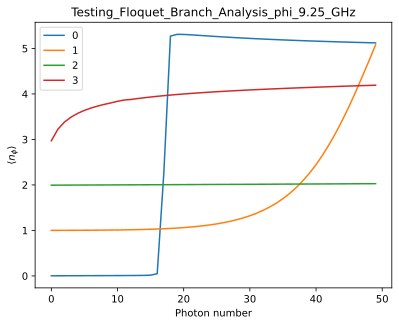

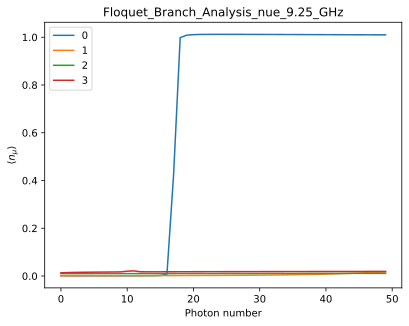

In [ ]:
# for list_no, omega_d_list in enumerate(omega_d_lists):    

branches_for_diff_omega_d_phi = []
branches_for_diff_omega_d_nue = []
quasienergies = []


for omega_d in omega_d_list:
    Hamiltonian = qubit_drive_strength(Omega_d = omega_d)
# The hamiltonian function returns all the required hamiltonians.
    H_sc = Hamiltonian["H_sc"]
    H_0 = Hamiltonian["H_0"] ### Hamiltonian with the coupling
    H_0 = dq.to_numpy(H_0)
    eval_0, evec_0 = np.linalg.eigh(H_0)
    print(H_0.shape)
    H_phi = Hamiltonian["H_phi"] ### Hamiltonian of the qubit.
    H_phi = dq.to_numpy(H_phi)
    eval_phi , evec_phi = np.linalg.eigh(H_phi)
    H_nue = Hamiltonian["H_nue"] ### Hamiltonian of an array.
    H_nue = dq.to_numpy(H_nue)
    eval_nue, evec_nue = np.linalg.eigh(H_nue)
    H_bare =  H_phi + H_nue
    eval_bare , evec_bare = np.linalg.eigh(H_bare)
    H_phi_ = Hamiltonian["H_phi_"] ### Hamiltonian of the qubit.
    H_phi_ = dq.to_numpy(H_phi_)
    eval_phi_ , evec_phi_ = np.linalg.eigh(H_phi_)
    H_nue_ = Hamiltonian["H_nue_"] ### Hamiltonian of an array.
    H_nue_ = dq.to_numpy(H_nue_)
    eval_nue_, evec_nue_ = np.linalg.eigh(H_nue_) # Hamiltonian without the tensor product with the array Identity .

    evec_H_0_bare_bare = dq.tensor(evec_phi_, evec_nue_).to_numpy() # the bare phi and neu to form the |k> x |n>

    n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
    I_nue = dq.eye(5)
    n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)

    # n_phi_operator = np.diag(np.arange(evec_phi_.shape[1]))
    # n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)
                                                

    new_H_phi_ = evec_phi_.conj().T @ H_phi_ @ evec_phi_
    new_n_operator = evec_phi_.conj().T @ Hamiltonian["n_fluxonium"]  @ evec_phi_
    new_phi_operator = evec_phi_.conj().T @ Hamiltonian["phi_fluxonium"]  @ evec_phi_
    new_H_neu = evec_nue_.conj().T @ H_nue_ @ evec_nue_

    new_eval_phi , new_evec_phi  = np.linalg.eigh(new_H_phi_)

    H_int = ((Hamiltonian["g_phi_nue"] * ( dq.tensor(new_n_operator, Hamiltonian["N_nue_"] ) ))/(Hamiltonian["N_phi_zpf"] * Hamiltonian["N_nue_zpf"]))


    I_phi = dq.eye(20)
    new_N_phi = dq.tensor(new_n_operator, I_nue)

    new_H_0 = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) + H_int)
    new_eval_0, new_evec_0 = np.linalg.eigh(new_H_0.to_numpy())
    new_H_bare = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) ).to_numpy()
    new_eval_bare, new_evec_bare = np.linalg.eigh(new_H_bare)

    def wrap_angle(theta):
        return jnp.mod(theta, 2 * jnp.pi)

    n_r_list = jnp.arange(0, 50, 1)
    omega_d = Hamiltonian["omega_d"]
    print(omega_d)

    epsilon_phi_r_1 = 2 * Hamiltonian["g_phi_r"] * jnp.sqrt (1)
    epsilon_nue_r_1 = 2 * Hamiltonian["g_nue_r"] * jnp.sqrt (1)

    def coeff_phi(t):
        p = wrap_angle(omega_d * t)
        return (epsilon_phi_r_1/Hamiltonian["N_phi_zpf"]) * jnp.cos(round(p, 5))

    def coeff_nue(t):
        p = wrap_angle(omega_d * t)
        return (epsilon_nue_r_1/Hamiltonian["N_nue_zpf"]) * jnp.cos(round(p, 5))

    V_sc_1 = (dq.modulated(coeff_phi, new_N_phi) + dq.modulated(coeff_nue, Hamiltonian["N_nue"]))

    V_sc = []

    for n_r in n_r_list:

        epsilon_phi_r = 2 * Hamiltonian["g_phi_r"] * jnp.sqrt (n_r)
        epsilon_nue_r = 2 * Hamiltonian["g_nue_r"] * jnp.sqrt (n_r)

        def coeff_phi(t):
            p = wrap_angle(omega_d * t)
            return jnp.cos(round(p, 5))

        def coeff_nue(t):
            p = wrap_angle(omega_d * t)
            return  jnp.cos(round(p, 5))

        V_sc.append((epsilon_phi_r/ Hamiltonian["N_phi_zpf"])* dq.modulated(coeff_phi, new_N_phi) + (epsilon_nue_r/ Hamiltonian["N_nue_zpf"])*dq.modulated(coeff_nue, Hamiltonian["N_nue"]))

    new_H_sc = []
    for n_r in n_r_list:
        #print(n_r)
        new_H_sc.append(new_H_0 + V_sc[n_r])

    floquet_states = []
    for i in n_r_list:
        T = (jnp.pi * 2)/ Hamiltonian["omega_d"]
        print(T)
        new_H_sc_i = new_H_sc[i]
        tsave = jnp.linspace(0, T, 1)
        floquet_state =  dq.floquet(new_H_sc_i, T, tsave)
        quasienergies.append(floquet_state.quasienergies)
        print(T)
        floquet_states.append(floquet_state)



    '''Now we check the overlap of the floquet eigenstates(modes) with the dressed eigenstates'''
    overlap_coup = []
    index_coup = []
    index_coup_wrt_n = []

    current_refs = [(new_evec_0[:, i]) for i in range(0,4)]  # seed: reference states start as the n̄_r=0 eigenstates

    for n, i in enumerate(floquet_states):
        index_coup = []
        new_refs = []
        n_modes = i.modes.shape[1]        # use actual dimension, not hardcoded 100; PJ - why?

        for l, k in enumerate(current_refs):   # <-- compare against current_refs (i_{l-1}), not evec_0
            temp = -1.0                       # <-- no 0.5 gate; Eq. 7 is an unconditional argmax
            temp_idx = None                    # <-- reset every l, fixes the stale-index bug

            for j in range(n_modes):
                x = i.modes[0, j]
                overlap = np.vdot(k, x)
                overlap_prob = np.abs(overlap)**2
                if overlap_prob > temp:
                    temp = overlap_prob
                    temp_idx = j

            index_coup.append(temp_idx)
            overlap_coup.append(temp)
            new_refs.append(i.modes[0, temp_idx])   # <-- carry this step's winner forward as next step's reference

        index_coup_wrt_n.append(index_coup)
        current_refs = new_refs


    n_phi_per_branch = []
    n_nue_per_branch = []

    n_branches = len(index_coup_wrt_n[0])   # number of tracked branches (e.g. 3)
    n_steps = len(floquet_states)           # actual n̄_r range, not hardcoded

    for l in range(n_branches):
        n_phi_branch = []
        n_nue_branch = []
        for n in range(n_steps):
            idx = index_coup_wrt_n[n][l]              # this branch's mode index at step n
            state = floquet_states[n].modes[0, idx]
            #quasienergies_each = floquet_states[n].quasienergies
            #quasienergies.append(quasienergies_each)
            n_phi = dq.expect(n_phi_operator_full, state)
            n_nue = dq.expect(Hamiltonian["n_nue"], state)
            n_phi_branch.append(float(n_phi.real))
            n_nue_branch.append(float(n_nue.real))
        n_phi_per_branch.append(n_phi_branch)
        n_nue_per_branch.append(n_nue_branch)

    branches_for_diff_omega_d_phi.append(n_phi_per_branch)
    branches_for_diff_omega_d_nue.append(n_nue_per_branch)
    # quasienergies.append(quasienergies_each)



    # print("#######",f"{omega_d} GHz","#######")
    for i in range(0,(len(n_phi_per_branch)  )):
        plt.plot(n_phi_per_branch[i], label = f'{i}')
    filename = f"Testing_Floquet_Branch_Analysis_phi_{omega_d}_GHz.pdf"

    plt.ylabel(r"$\langle n_\phi \rangle$")
    plt.xlabel("Photon number")
    plt.legend()
    plt.title(f"Testing_Floquet_Branch_Analysis_phi_{omega_d}_GHz")
    plt.savefig(filename, bbox_inches='tight')
    plt.show()
    # for i in range(0, 3):#(len(n_phi_per_branch) -1)):
    #     plt.plot(n_phi_per_branch[i])
    # plt.show()
    for i in range(0, (len(n_nue_per_branch) )):
        plt.plot(n_nue_per_branch[i], label = f'{i}')
    filename = f"Testing_Floquet_Branch_Analysis_nue_{omega_d}_GHz.pdf"
    plt.ylabel(r"$\langle n_\mu \rangle$")
    plt.xlabel("Photon number")
    plt.legend()
    plt.title(f"Floquet_Branch_Analysis_nue_{omega_d}_GHz")
    plt.savefig(filename, bbox_inches='tight')
    plt.show()



    
    # for i in range(0, 3):# (len(n_nue_per_branch) -1)):
    #     plt.plot(n_nue_per_branch[i])
    

# np.save(f"1000_steps_data_phi_part_{list_no + 4}.npy", np.array(branches_for_diff_omega_d_phi))
# np.save(f"1000_steps_data_nue_part_{list_no + 4}.npy", np.array(branches_for_diff_omega_d_nue))

# np.save(f"1000_steps_data_phi_part_2.npy", np.array(branches_for_diff_omega_d_phi))
# np.save(f"1000_steps_data_nue_part_2.npy", np.array(branches_for_diff_omega_d_nue))


In [114]:
len(quasienergies[0].shape)

1

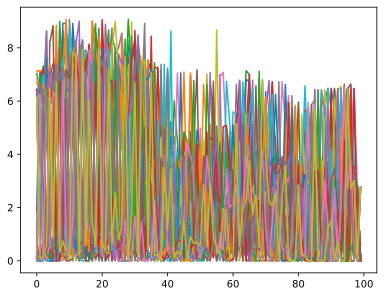

In [152]:
x = [[np.abs(quasienergies[i+1][j+1] - quasienergies[i][j])for i in range(0,49)] for j in range(0, 100)]#- quasienergies[3][0]
plt.plot(x)

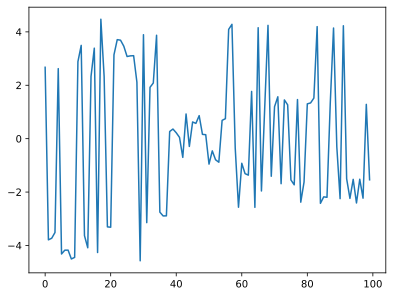

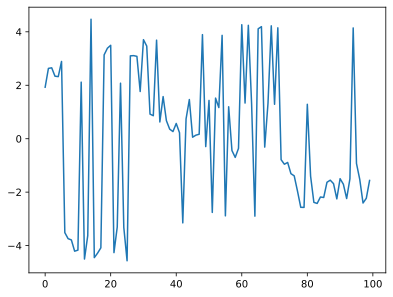

In [83]:
plt.plot((quasienergies[10]))
plt.show()
plt.plot((quasienergies[1]))
plt.show()

[0.0288698673248291, 5.993395566940308, -8.684584617614746]
[0.02861499786376953, 5.9932637214660645, -8.678810119628906]
[0.02835822105407715, 5.993133306503296, -8.673973560333252]
[0.02809906005859375, 5.993002891540527, -8.669745922088623]
[0.027843236923217773, 5.992872714996338, -8.66595983505249]
[0.027585983276367188, 5.9927451610565186, -8.662516593933105]
[0.0273282527923584, 5.992614984512329, -8.659335136413574]
[0.02706742286682129, 5.9924914836883545, -8.656379699707031]
[0.026805877685546875, 5.99236536026001, -8.653610706329346]
[0.026546001434326172, 5.992241382598877, -8.651000499725342]


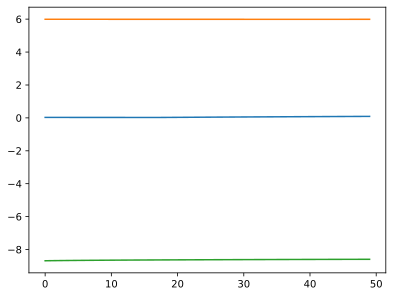

In [43]:
quasienergies_related_to_coup_per_n = []
for n, i in enumerate(index_coup_wrt_n):



    quasienergies_per_photon_number = floquet_states[n].quasienergies
    quasienergies_related_to_coup = []
    for j in i:


        quasienergies_related_to_coup.append(float(quasienergies_per_photon_number[j]))
    quasienergies_related_to_coup_per_n.append(quasienergies_related_to_coup)




transition_energy_per_n =[]
for n, i in enumerate(quasienergies_related_to_coup_per_n):
    transition_energies = []
    for j in range(0,(len(i)-1)):

        transition_energy = i[j+1] - i[j]
        transition_energies.append(transition_energy)

    transition_energy_per_n.append(transition_energies)

for i in range(0,10):
    print(transition_energy_per_n[i])
plt.plot(transition_energy_per_n)

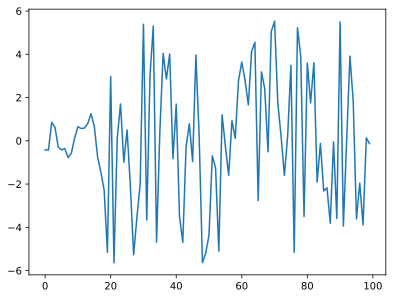

In [24]:
plt.plot(quasienergies[1] - quasienergies[0])

In [358]:
n_phi_operator = np.diag(np.arange(evec_phi_.shape[1]))
n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)

In [360]:
n_phi_operator_full

QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[ 0.+0.j  0.+0.j  0.+0.j ...  0.+0.j  0.+0.j  0.+0.j]
 [ 0.+0.j  0.+0.j  0.+0.j ...  0.+0.j  0.+0.j  0.+0.j]
 [ 0.+0.j  0.+0.j  0.+0.j ...  0.+0.j  0.+0.j  0.+0.j]
 ...
 [ 0.+0.j  0.+0.j  0.+0.j ... 19.+0.j  0.+0.j  0.+0.j]
 [ 0.+0.j  0.+0.j  0.+0.j ...  0.+0.j 19.+0.j  0.+0.j]
 [ 0.+0.j  0.+0.j  0.+0.j ...  0.+0.j  0.+0.j 19.+0.j]]

In [356]:
[(new_evec_0[:, i]) for i in range(0,3)] 

[array([-9.99529064e-01+0.j,  3.46944695e-18+0.j,  1.02270988e-03+0.j,
         0.00000000e+00+0.j, -1.45009881e-06+0.j,  2.20772806e-15+0.j,
        -8.37701722e-04+0.j, -6.30961667e-18+0.j, -7.32183537e-07+0.j,
         1.09040831e-20+0.j, -9.57236276e-04+0.j,  1.41295789e-15+0.j,
         2.73741782e-04+0.j, -2.18353906e-18+0.j, -3.91077265e-07+0.j,
        -3.24453199e-18+0.j, -3.04742437e-02+0.j,  9.24857822e-19+0.j,
         5.94483427e-05+0.j,  7.78419204e-21+0.j, -2.16429192e-03+0.j,
        -3.08255857e-16+0.j,  9.39154415e-04+0.j,  1.31082164e-18+0.j,
        -1.96389010e-06+0.j, -8.96061663e-17+0.j, -1.24029256e-03+0.j,
         4.43269117e-17+0.j, -3.20431650e-06+0.j, -1.24266038e-19+0.j,
        -6.52290473e-04+0.j,  8.81505401e-17+0.j,  3.68957320e-04+0.j,
        -1.49603689e-18+0.j, -1.20715276e-06+0.j, -6.24806574e-18+0.j,
         6.24976121e-04+0.j,  3.73200028e-18+0.j, -1.01347387e-05+0.j,
        -8.21972121e-21+0.j,  1.67573075e-04+0.j,  7.55728917e-18+0.j,
      

In [30]:
branches_for_diff_omega_d_nue

[[[0.0009376679081469774,
   0.00097821990493685,
   0.0010186632862314582,
   0.0010591264581307769,
   0.0010995232732966542,
   0.0011398764327168465,
   0.0011801650980487466,
   0.0012204281520098448,
   0.0012606338132172823,
   0.0013007932575419545,
   0.0013409204548224807,
   0.0013809595257043839,
   0.0014210212975740433,
   0.0014609884237870574,
   0.0015008992049843073,
   0.001540787168778479,
   0.001580599695444107,
   0.0016203946433961391,
   0.001660156762227416,
   0.0016998476348817348,
   0.0017394749447703362,
   0.0017790703568607569,
   0.0018186037195846438,
   0.001858088537119329,
   0.0018975698621943593,
   0.001936980988830328,
   0.0019762904848903418,
   0.0020156209357082844,
   0.0020548906177282333,
   0.0020940701942890882,
   0.002133238362148404,
   0.002172328531742096,
   0.0022113851737231016,
   0.002250382676720619,
   0.0022893408313393593,
   0.002328254282474518,
   0.0023670936934649944,
   0.002405914943665266,
   0.002444665413349867,

In [ ]:
np.save("200_steps_data_phi.npy", np.array(branches_for_diff_omega_d_phi))
np.save("200_steps_data_nue.npy", np.array(branches_for_diff_omega_d_nue))

In [14]:
omega_d_list

array([8.5 , 8.51, 8.52, 8.53, 8.54, 8.55, 8.56, 8.57, 8.58, 8.59, 8.6 ,
       8.61, 8.62, 8.63, 8.64, 8.65, 8.66, 8.67, 8.68, 8.69, 8.7 , 8.71,
       8.72, 8.73, 8.74, 8.75, 8.76, 8.77, 8.78, 8.79, 8.8 , 8.81, 8.82,
       8.83, 8.84, 8.85, 8.86, 8.87, 8.88, 8.89, 8.9 , 8.91, 8.92, 8.93,
       8.94, 8.95, 8.96, 8.97, 8.98, 8.99, 9.  , 9.01, 9.02, 9.03, 9.04,
       9.05, 9.06, 9.07, 9.08, 9.09, 9.1 , 9.11, 9.12, 9.13, 9.14, 9.15,
       9.16, 9.17, 9.18, 9.19, 9.2 , 9.21, 9.22, 9.23, 9.24, 9.25, 9.26,
       9.27, 9.28, 9.29, 9.3 , 9.31, 9.32, 9.33, 9.34, 9.35, 9.36, 9.37,
       9.38, 9.39, 9.4 , 9.41, 9.42, 9.43, 9.44, 9.45, 9.46, 9.47, 9.48,
       9.49, 9.5 ])

12.419443130493164
1.0121028423309326
Figure saved as: floquet_Reds.pdf


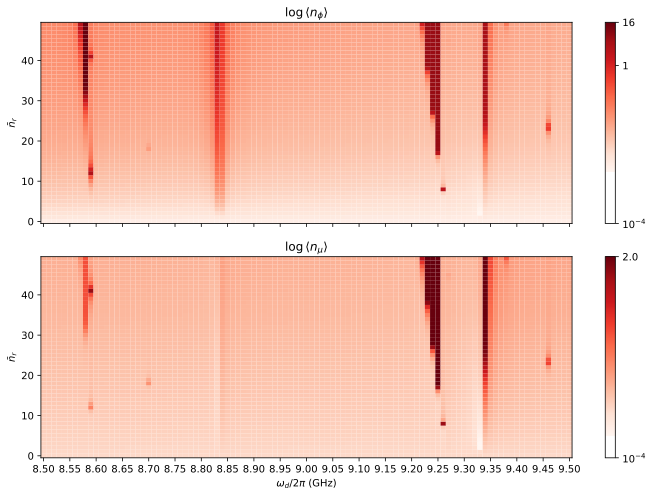

6.994377136230469
0.7995234727859497
Figure saved as: floquet_Greens.pdf


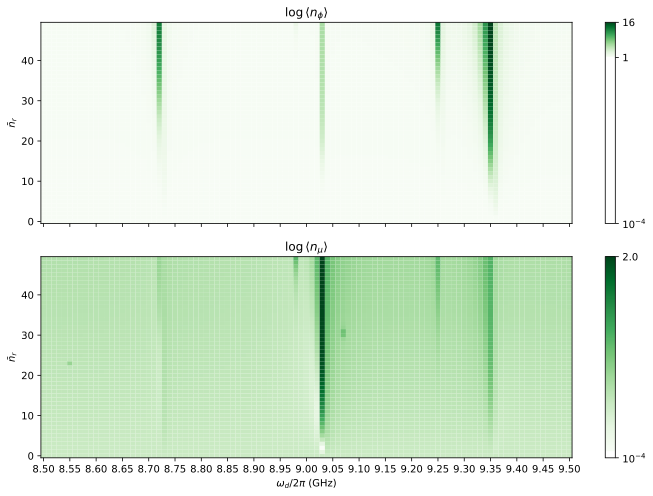

9.656903266906738
0.431725412607193
Figure saved as: floquet_Blues.pdf


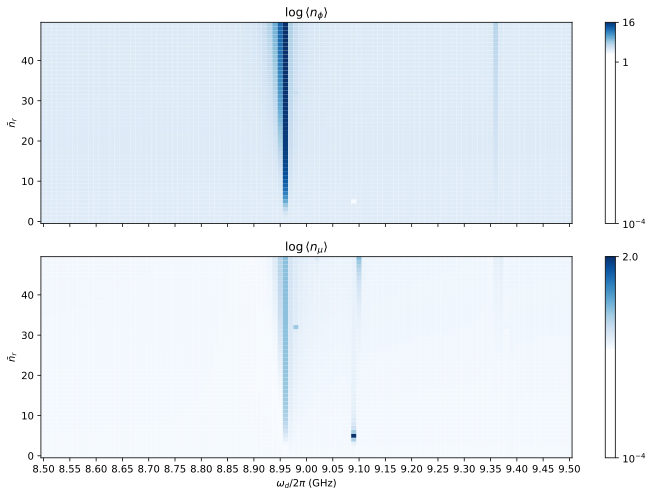

In [28]:
for plot in range(0, 3):

    if plot == 0:
        cmap = "Reds"
    elif plot == 1:
        cmap =  "Greens"
    else:
        cmap =  "Blues"

    x_1 = np.zeros((101, 50), dtype = float)
    xx_1 = np.zeros((101, 50), dtype = float)

    for i in range(0,101):
        for j in range(0,50):
            l = branches_for_diff_omega_d_phi[i][plot][j]
            x_1[i][j] = l
            m = branches_for_diff_omega_d_nue[i][plot][j]
            xx_1[i][j] = m


    nbar_vals = np.arange(0, 50)  
    floor = 1e-20   # avoid log(0)


    log_n_phi = np.log(x_1.T )
    log_n_nue  = np.log(xx_1.T)


    cmin=10**(-4)
    cmid=1
    cmax=np.max(np.transpose(x_1))
    print(cmax)
    len(omega_d_list)
    omega_d_list
    fig, axes = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

    im0 = axes[0].pcolormesh(omega_d_list, nbar_vals, log_n_phi, shading = 'auto' , cmap=cmap)#, norm = colors.LogNorm(vmin = 1e-4, vmax = 17))
    axes[0].set_ylabel(r'$\bar{n}_r$')
    axes[0].set_title(r'$\log\langle n_\phi \rangle$')
    axes[0].set_xticks([8.5 , 8.55, 8.6 , 8.65, 8.7 , 8.75, 8.8 , 8.85, 8.9 , 8.95, 9.  ,
        9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 , 9.45, 9.5 ])
    # axes[0].set_xticks([8.5, 9.0, 9.5])
    cbar = plt.colorbar(im0)
    cbar.ax.set_yticks([np.log(cmin),np.log(cmid),np.log(cmax)],[r"$10^{-4}$",r"$1$",rf"$16$"],fontsize=10)  #{np.round(cmax)}



    cmin=10**(-4)
    cmid=1
    cmax=np.max(np.transpose(xx_1))
    print(cmax)



    im1 = axes[1].pcolormesh(omega_d_list, nbar_vals, log_n_nue ,
                            shading='auto', cmap= cmap)#, norm =2colors.LogNorm(vmin = 1e-4, vmax = 1))
    axes[1].set_xlabel(r'$\omega_d/2\pi$ (GHz)')
    axes[1].set_ylabel(r'$\bar{n}_r$')
    axes[1].set_title(r'$\log\langle n_\mu \rangle$')
    axes[1].set_xticks([8.5 , 8.55, 8.6 , 8.65, 8.7 , 8.75, 8.8 , 8.85, 8.9 , 8.95, 9.  ,
            9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 , 9.45, 9.5 ])
    #fig.colorbar(im1)
    cbar = plt.colorbar(im1)
    cbar.ax.set_yticks([np.log(cmin),np.log(cmax)],[r"$10^{-4}$",rf"$2.0$"],fontsize=10)
    #cbar.set_ticklabels([r"$10^{-4}$","1"])
    filename = f"floquet_{cmap}.pdf"

    fig.savefig(filename, bbox_inches='tight')
    print(f"Figure saved as: {filename}")
    plt.tight_layout()
    plt.show()

In [302]:
np.log(cmax)

np.float64(1.092818975508679)

5.309378623962402
1.0120967626571655


 /tmp/ipykernel_1078063/4070293620.py: 52RuntimeWarning: invalid value encountered in scalar multiply
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/matplotlib/transforms.py: 2692

Figure saved as: floquet.pdf


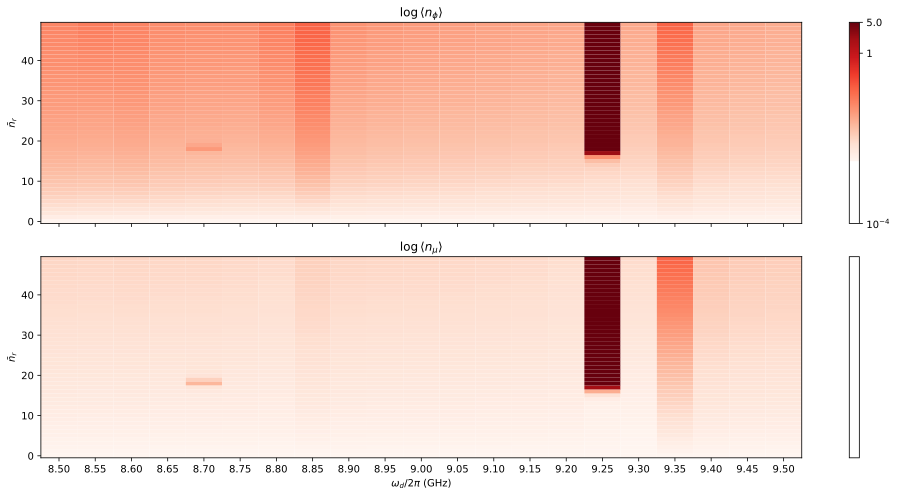

In [ ]:
x_1 = np.zeros((21, 50), dtype = float)
xx_1 = np.zeros((21, 50), dtype = float)

for i in range(0,21):
    for j in range(0,50):
        l = branches_for_diff_omega_d_phi[i][0][j]
        x_1[i][j] = l
        m = branches_for_diff_omega_d_nue[i][0][j]
        xx_1[i][j] = m


nbar_vals = np.arange(0, 50)  
floor = 1e-20   # avoid log(0)


log_n_phi = np.log(x_1.T )
log_n_nue  = np.log(xx_1.T)


cmin=10**(-4)
cmid=1
cmax=np.max(np.transpose(x_1))
print(cmax)
len(omega_d_list)
omega_d_list
fig, axes = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

im0 = axes[0].pcolormesh(omega_d_list, nbar_vals, log_n_phi, shading = 'auto' , cmap='Reds')#, norm = colors.LogNorm(vmin = 1e-4, vmax = 17))
axes[0].set_ylabel(r'$\bar{n}_r$')
axes[0].set_title(r'$\log\langle n_\phi \rangle$')
axes[0].set_xticks([8.5 , 8.55, 8.6 , 8.65, 8.7 , 8.75, 8.8 , 8.85, 8.9 , 8.95, 9.  ,
       9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 , 9.45, 9.5 ])
cbar = plt.colorbar(im0)
cbar.ax.set_yticks([np.log(cmin),np.log(cmid),np.log(cmax)],[r"$10^{-4}$",r"$1$",rf"$13$"],fontsize=10)  #{np.round(cmax)}



cmin=10**(-4)
cmid=0
cmax=np.max(np.transpose(xx_1.T * 1 ))
print(cmax)



im1 = axes[1].pcolormesh(omega_d_list, nbar_vals, log_n_nue ,
                          shading='auto', cmap='Reds')#, norm =2colors.LogNorm(vmin = 1e-4, vmax = 1))
axes[1].set_xlabel(r'$\omega_d/2\pi$ (GHz)')
axes[1].set_ylabel(r'$\bar{n}_r$')
axes[1].set_title(r'$\log\langle n_\mu \rangle$')
#fig.colorbar(im1)
cbar = plt.colorbar(im1)
cbar.ax.set_yticks([np.log(cmin),np.log(cmid),np.log(cmax)],[r"$10^{-4}$",r"$1$",rf"${np.round(cmax)}$"],fontsize=10)
#cbar.set_ticklabels([r"$10^{-4}$","1"])
filename = f"floquet.pdf"

fig.savefig(filename, bbox_inches='tight')
print(f"Figure saved as: {filename}")
plt.tight_layout()
plt.show()

In [ ]:
Hamiltonian = qubit_drive_strength(Omega_d = omega_d)
# The hamiltonian function returns all the required hamiltonians.
H_sc = Hamiltonian["H_sc"] ### Time dependent hamiltonian for each
H_0 = Hamiltonian["H_0"] ### Hamiltonian with the coupling
H_0 = dq.to_numpy(H_0)
eval_0, evec_0 = np.linalg.eigh(H_0)
print(H_0.shape)
H_phi = Hamiltonian["H_phi"] ### Hamiltonian of the qubit.
H_phi = dq.to_numpy(H_phi)
eval_phi , evec_phi = np.linalg.eigh(H_phi)
H_nue = Hamiltonian["H_nue"] ### Hamiltonian of an array.
H_nue = dq.to_numpy(H_nue)
eval_nue, evec_nue = np.linalg.eigh(H_nue)
H_bare =  H_phi + H_nue
eval_bare , evec_bare = np.linalg.eigh(H_bare)
H_phi_ = Hamiltonian["H_phi_"] ### Hamiltonian of the qubit.
H_phi_ = dq.to_numpy(H_phi_)
eval_phi_ , evec_phi_ = np.linalg.eigh(H_phi_)
H_nue_ = Hamiltonian["H_nue_"] ### Hamiltonian of an array.
H_nue_ = dq.to_numpy(H_nue_)
eval_nue_, evec_nue_ = np.linalg.eigh(H_nue_) # Hamiltonian without the tensor product with the array Identity .

evec_H_0_bare_bare = dq.tensor(evec_phi_, evec_nue_).to_numpy() # the bare phi and neu to form the |k> x |n>

n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
I_nue = dq.eye(5)
n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)



(20, 20)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[ 0.00000000e+00+0.j -4.55495221e-30+0.j  0.00000000e+00+0.j ...
   0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j]
 [ 4.55495221e-30+0.j  0.00000000e+00+0.j -6.44167519e-30+0.j ...
  -1.06662503e-02+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j]
 [ 0.00000000e+00+0.j  6.44167519e-30+0.j  0.00000000e+00+0.j ...
   0.00000000e+00+0.j -1.30634345e-02+0.j  0.00000000e+00+0.j]
 ...
 [ 0.00000000e+00+0.j -1.06662503e-02+0.j  0.00000000e+00+0.j ...
   0.00000000e+00+0.j -1.74775600e-29+0.j  0.00000000e+00+0.j]
 [ 0.00000000e+00+0.j  0.00000000e+00+0.j -1.30634345e-02+0.j ...
   1.74775600e-29+0.j  0.00000000e+00+0.j -2.01813489e-29+0.j]
 [ 0.00000000e+00+0.j  0.00000000e+00+0.j  0.00000000e+00+0.j ...
   0.00000000e+00+0.j  2.01813489e-29+0.j  0.00000000e+00+0.j]]
1.3907764387314137
0.35951141109067913
(100, 100)


In [247]:
H_0

array([[-9.64543343e+00+0.j, -4.55495221e-30+0.j,  0.00000000e+00+0.j,
        ...,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
         0.00000000e+00+0.j],
       [ 4.55495221e-30+0.j,  6.61297836e+01+0.j, -6.44167519e-30+0.j,
        ..., -1.06662503e-02+0.j,  0.00000000e+00+0.j,
         0.00000000e+00+0.j],
       [ 0.00000000e+00+0.j,  6.44167519e-30+0.j,  1.41904984e+02+0.j,
        ...,  0.00000000e+00+0.j, -1.30634345e-02+0.j,
         0.00000000e+00+0.j],
       ...,
       [ 0.00000000e+00+0.j, -1.06662503e-02+0.j,  0.00000000e+00+0.j,
        ...,  3.86613556e+02+0.j, -1.74775600e-29+0.j,
         0.00000000e+00+0.j],
       [ 0.00000000e+00+0.j,  0.00000000e+00+0.j, -1.30634345e-02+0.j,
        ...,  1.74775600e-29+0.j,  4.62388794e+02+0.j,
        -2.01813489e-29+0.j],
       [ 0.00000000e+00+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j,
        ...,  0.00000000e+00+0.j,  2.01813489e-29+0.j,
         5.38164001e+02+0.j]], shape=(100, 100), dtype=complex64)

In [336]:
new_H_phi_ = evec_phi_.conj().T @ H_phi_ @ evec_phi_
new_n_operator = evec_phi_.conj().T @ Hamiltonian["n_fluxonium"]  @ evec_phi_
new_phi_operator = evec_phi_.conj().T @ Hamiltonian["phi_fluxonium"]  @ evec_phi_
new_H_neu = evec_nue_.conj().T @ H_nue_ @ evec_nue_

In [337]:
Hamiltonian["omega_d"]

9.03

In [9]:
new_eval_phi , new_evec_phi  = np.linalg.eigh(new_H_phi_)

In [8]:
I_nue = dq.eye(5)
I_phi = dq.eye(20)
new_N_phi = dq.tensor(new_n_operator, I_nue)
#new_N_nue = dq.tensor(n_fluxonium, I_nue)

In [11]:
x = dq.tensor(new_n_operator, Hamiltonian["N_nue_"] )

In [ ]:
H_int = ((Hamiltonian["g_phi_nue"] * ( dq.tensor(new_n_operator, Hamiltonian["N_nue_"] ) ))/(Hamiltonian["N_phi_zpf"] * Hamiltonian["N_nue_zpf"]))

In [14]:
H_int.shape

(100, 100)

In [338]:
new_H_0 = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) + H_int)

In [339]:
new_H_0 = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) + H_int)
new_eval_0, new_evec_0 = np.linalg.eigh(new_H_0.to_numpy())
new_H_bare = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) ).to_numpy()
new_eval_bare, new_evec_bare = np.linalg.eigh(new_H_bare)

In [340]:
new_eval_0

array([-1.5525391, -1.5236683,  4.469726 ,  5.0351434,  8.95563  ,
       10.547514 , 10.584818 , 11.177457 , 14.2247095, 15.932165 ,
       16.117594 , 16.540167 , 17.106857 , 17.192057 , 19.42043  ,
       20.840004 , 21.14911  , 22.394148 , 22.64775  , 22.69252  ,
       23.248678 , 24.236586 , 26.249262 , 26.257854 , 28.017532 ,
       28.108194 , 28.377089 , 28.610905 , 29.179714 , 29.215158 ,
       30.384169 , 31.455082 , 32.54984  , 32.830864 , 33.258823 ,
       34.430927 , 34.748333 , 34.76136  , 34.800762 , 35.318638 ,
       36.300976 , 37.168156 , 38.29218  , 38.323112 , 40.10118  ,
       40.137707 , 40.49581  , 40.687176 , 41.242462 , 41.26208  ,
       42.46258  , 43.49183  , 44.620144 , 44.848347 , 45.36108  ,
       46.47316  , 46.820522 , 46.92466  , 46.991093 , 47.41638  ,
       48.366013 , 49.140976 , 50.365944 , 50.394283 , 52.18053  ,
       52.19572  , 52.61446  , 53.07783  , 53.317764 , 53.800053 ,
       54.544613 , 55.55824  , 56.694336 , 57.07577  , 57.8229

In [17]:
new_H_bare = (dq.tensor(new_H_phi_, I_nue) + dq.tensor(I_phi, new_H_neu) ).to_numpy()
new_eval_bare, new_evec_bare = np.linalg.eigh(new_H_bare)

In [18]:
def wrap_angle(theta):
    return jnp.mod(theta, 2 * jnp.pi)


In [19]:
n_r_list = jnp.arange(0, 50, 1)
omega_d = Hamiltonian["omega_d"]
print(omega_d)

epsilon_phi_r_1 = 2 * Hamiltonian["g_phi_r"] * jnp.sqrt (1)
epsilon_nue_r_1 = 2 * Hamiltonian["g_nue_r"] * jnp.sqrt (1)

def coeff_phi(t):
    p = wrap_angle(omega_d * t)
    return (epsilon_phi_r_1/Hamiltonian["N_phi_zpf"]) * jnp.cos(round(p, 3))

def coeff_nue(t):
    p = wrap_angle(omega_d * t)
    return (epsilon_nue_r_1/Hamiltonian["N_nue_zpf"]) * jnp.cos(round(p, 3))

V_sc_1 = (dq.modulated(coeff_phi, new_N_phi) + dq.modulated(coeff_nue, Hamiltonian["N_nue"]))

V_sc = []

for n_r in n_r_list:

    epsilon_phi_r = 2 * Hamiltonian["g_phi_r"] * jnp.sqrt (n_r)
    epsilon_nue_r = 2 * Hamiltonian["g_nue_r"] * jnp.sqrt (n_r)

    def coeff_phi(t):
        p = wrap_angle(omega_d * t)
        return jnp.cos(round(p, 3))

    def coeff_nue(t):
        p = wrap_angle(omega_d * t)
        return  jnp.cos(round(p, 3))

    V_sc.append((epsilon_phi_r/ Hamiltonian["N_phi_zpf"])* dq.modulated(coeff_phi, new_N_phi) + (epsilon_nue_r/ Hamiltonian["N_nue_zpf"])*dq.modulated(coeff_nue, Hamiltonian["N_nue"]))


56.234508499257295


In [20]:
V_sc[49]

SummedTimeQArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense

In [21]:
new_H_sc = []
for n_r in n_r_list:
    #print(n_r)
    new_H_sc.append(new_H_0 + V_sc[n_r])


In [22]:
new_H_sc[5]

SummedTimeQArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense

In [23]:
floquet_states = []
for i in n_r_list:
    T = (jnp.pi * 2)/ Hamiltonian["omega_d"]
    print(T)
    new_H_sc_i = new_H_sc[i]
    tsave = jnp.linspace(0, T, 1)
    floquet_state =  dq.floquet(new_H_sc_i, T, tsave)
    print(T)
    floquet_states.append(floquet_state)



'''Now we check the overlap of the floquet eigenstates(modes) with the dressed eigenstates'''
overlap_coup = []
index_coup = []
index_coup_wrt_n = []

current_refs = list(new_evec_0[:20])   # seed: reference states start as the n̄_r=0 eigenstates

for n, i in enumerate(floquet_states):
    index_coup = []
    new_refs = []
    n_modes = i.modes.shape[1]        # use actual dimension, not hardcoded 100; PJ - why?

    for l, k in enumerate(current_refs):   # <-- compare against current_refs (i_{l-1}), not evec_0
        temp = -1.0                        # <-- no 0.5 gate; Eq. 7 is an unconditional argmax
        temp_idx = None                    # <-- reset every l, fixes the stale-index bug

        for j in range(n_modes):
            x = i.modes[0, j]
            overlap = np.vdot(k, x)
            overlap_prob = np.abs(overlap)**2
            if overlap_prob > temp:
                temp = overlap_prob
                temp_idx = j

        index_coup.append(temp_idx)
        overlap_coup.append(temp)
        new_refs.append(i.modes[0, temp_idx])   # <-- carry this step's winner forward as next step's reference

    index_coup_wrt_n.append(index_coup)
    current_refs = new_refs

0.111731843575419


|██████████| 100.0% ◆ elapsed 201.04ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 160.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 92.52ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 135.21ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 232.18ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 243.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 121.01ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 252.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 125.09ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 241.08ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 223.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 132.93ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 76.33ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 105.20ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 229.60ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 248.22ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 112.76ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 79.34ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 142.11ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 218.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 111.96ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 235.97ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 222.99ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 75.07ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 118.41ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 167.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 83.58ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 150.25ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 88.79ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 124.93ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 228.70ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 84.17ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 122.03ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 249.87ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 107.19ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 236.35ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 228.27ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 103.05ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 122.31ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 227.92ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 227.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 232.27ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 270.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 231.06ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 261.68ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 133.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 237.77ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 249.26ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 150.17ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.111731843575419
0.111731843575419


|██████████| 100.0% ◆ elapsed 96.45ms ◆ remaining 0.00ms


0.111731843575419


In [236]:
y = new_H_0.to_qutip()

In [237]:
check_eval , check_evec = y.eigenstates()

In [238]:
np.diag(y.full())[::5]/(2 * np.pi)

array([-1.53511841+0.j, -1.50466578+0.j,  4.54401739+0.j,  5.13754808+0.j,
        9.07722123+0.j, 11.34328068+0.j, 14.40375427+0.j, 15.96799873+0.j,
       16.15098587+0.j, 17.37260133+0.j, 19.5802824 +0.j, 21.14361859+0.j,
       22.6206637 +0.j, 24.48281976+0.j, 26.51640446+0.j, 28.56457481+0.j,
       30.68241186+0.j, 32.88132964+0.j, 35.13039619+0.j, 37.41146081+0.j])

In [239]:
new_eval_phi[:20]/(2 * np.pi)

array([-1.53511848, -1.5046658 ,  4.54401737,  5.13754826,  9.07722145,
       11.3432808 , 14.40375381, 15.96799887, 16.15098562, 17.37260103,
       19.58028298, 21.14361819, 22.62066274, 24.48281955, 26.51640547,
       28.56457471, 30.68241217, 32.88133069, 35.13039608, 37.41146135])

In [240]:
check_eval[:20]/ (2 * np.pi)

array([-1.5525391 , -1.52366821,  4.46972613,  5.03514315,  8.95562922,
       10.54751366, 10.5848184 , 11.17745631, 14.22470957, 15.93216515,
       16.1175944 , 16.54016628, 17.10685696, 17.19205736, 19.42042944,
       20.84000404, 21.14911188, 22.39414913, 22.64774988, 22.69251746])

####### 8.95 #######


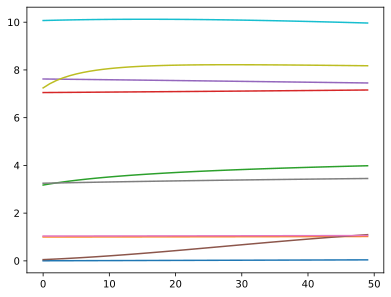

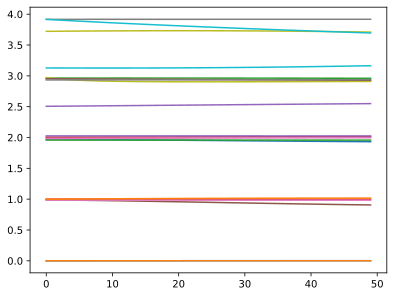

In [25]:
n_phi_per_branch = []
n_nue_per_branch = []

n_branches = len(index_coup_wrt_n[0])   # number of tracked branches (e.g. 3)
n_steps = len(floquet_states)           # actual n̄_r range, not hardcoded

for l in range(n_branches):
    n_phi_branch = []
    n_nue_branch = []
    for n in range(n_steps):
        idx = index_coup_wrt_n[n][l]              # this branch's mode index at step n
        state = floquet_states[n].modes[0, idx]
        n_phi = dq.expect(n_phi_operator_full, state)
        n_nue = dq.expect(Hamiltonian["n_nue"], state)
        n_phi_branch.append(float(n_phi.real))
        n_nue_branch.append(float(n_nue.real))
    n_phi_per_branch.append(n_phi_branch)
    n_nue_per_branch.append(n_nue_branch)

#branches_for_diff_omega_d_phi.append(n_phi_per_branch)
#branches_for_diff_omega_d_nue.append(n_nue_per_branch)



print("#######",f"{omega_d/ (2 * jnp.pi)}","#######")
for i in range(0,10):#(len(n_phi_per_branch) )):
    plt.plot(n_phi_per_branch[i])
plt.show()
# for i in range(0, 3):#(len(n_phi_per_branch) -1)):
#     plt.plot(n_phi_per_branch[i])
# plt.show()
for i in range(0, (len(n_nue_per_branch) )):
    plt.plot(n_nue_per_branch[i])
plt.show()
# for i in range(0, 3):# (len(n_nue_per_branch) -1)):
#     plt.plot(n_nue_per_branch[i])
plt.show()


####### 56.423004058472685 #######


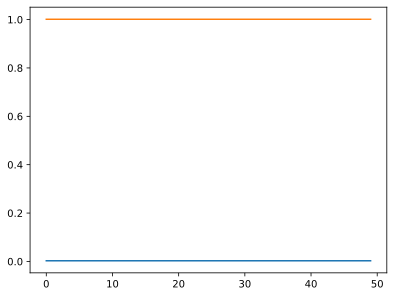

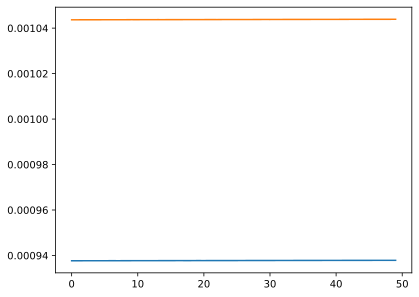

In [243]:
print("#######",f"{omega_d/ (2 * jnp.pi)}","#######")
for i in range(0,(len(n_phi_per_branch) )):
    plt.plot(n_phi_per_branch[i])
plt.show()
# for i in range(0, 3):#(len(n_phi_per_branch) -1)):
#     plt.plot(n_phi_per_branch[i])
# plt.show()
for i in range(0, (len(n_nue_per_branch) )):
    plt.plot(n_nue_per_branch[i])
plt.show()
# for i in range(0, 3):# (len(n_nue_per_branch) -1)):
#     plt.plot(n_nue_per_branch[i])
plt.show()

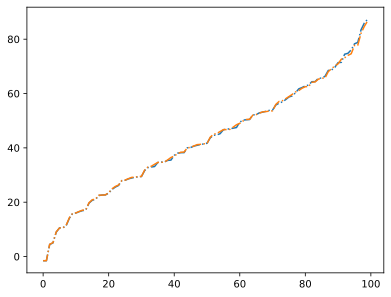

In [154]:
plt.plot(new_eval_0/(2*np.pi), '-.')
plt.plot(new_eval_bare/(2*np.pi), '-.')


In [94]:
index = []
overlaps = []
for j in range(0, (len(new_evec_0)- 1)):
    y = new_evec_0[:, j]

    #print(x)
    temp = 0.8 # PJ - can be 0.8?
    for i in range(0, (len(new_evec_bare)-1)):
        x = new_evec_bare[:, i]
        overlap = np.vdot(x, y)
        overlap_prob = np.abs(overlap) ** 2
        if overlap_prob > temp:
            temp = overlap_prob
            temp_idx = i
    index.append(temp_idx) # PJ - print index and check if there is any repetition
    overlaps.append(temp)

In [95]:
index

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 19,
 17,
 18,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 31,
 31,
 31,
 31,
 35,
 36,
 38,
 38,
 38,
 41,
 42,
 43,
 44,
 45,
 45,
 45,
 48,
 49,
 50,
 51,
 51,
 51,
 51,
 51,
 55,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 64,
 65,
 65,
 65,
 65,
 68,
 68,
 68,
 68,
 72,
 73,
 73,
 73,
 76,
 76,
 76,
 76,
 80,
 82,
 83,
 83,
 83,
 83,
 83,
 83,
 88,
 88,
 88,
 88,
 88,
 88,
 95,
 95,
 97,
 98]

In [99]:
index_coup_wrt_n[50]

IndexError: list index out of range

In [10]:
Hamiltonian = qubit_drive_strength( Omega_d = omega_d)

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913


In [226]:
H_phi_ = Hamiltonian["H_phi_"] ### Hamiltonian of the qubit.
H_phi_ = dq.to_numpy(H_phi_)
eval_phi_ , evec_phi_ = np.linalg.eigh(H_phi_)
H_nue_ = Hamiltonian["H_nue_"] ### Hamiltonian of an array.
H_nue_ = dq.to_numpy(H_nue_)
eval_nue_, evec_nue_ = np.linalg.eigh(H_nue_) # Hamiltonian without the tensor product with the array Identity .

H_0_bare_bare = dq.tensor(H_phi_, H_nue_).to_numpy()
eval_H_0_bare_bare_, evec_H_0_bare_bare_ = np.linalg.eigh(H_0_bare_bare)
evec_H_0_bare_bare = dq.tensor(evec_phi_, evec_nue_).to_numpy() # the bare phi and neu to form the |k> x |n>
eval_H_0_bare_bare = []
sorted_eval_H_0_bare_bare = []
for i , eval_phi_bare in enumerate(eval_phi_):
    for j , eval_nue_bare in enumerate(eval_nue_):
        eval_H_0_bare_bare_ = eval_phi_bare + eval_nue_bare
        #print(f"|{i},{j}> ---- {eval_H_0_bare_bare}")
        eval_H_0_bare_bare.append(float(eval_H_0_bare_bare_))
        sorted_eval_H_0_bare_bare.append(float(eval_H_0_bare_bare_))
sorted_eval_H_0_bare_bare.sort()

In [ ]:
n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
H_phi_new =  evec_phi @ evec_phi.conj().T

In [251]:
I_nue = dq.eye(5)

In [254]:
n_phi_operator_full = dq.tensor(n_phi_operator, I_nue).to_numpy()

In [280]:
Hamiltonian["n_phi_zpf"]

QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[2.4651902e-32+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 2.4651902e-32+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 2.4651902e-32+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 ...
 [0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  3.8000000e+01+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 3.8000000e+01+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 3.8000000e+01+0.j]]

In [281]:
n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
I_nue = dq.eye(5)
n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)
n_phi_operator_full

QArray: shape=(100, 100), dims=(20, 5), dtype=complex64, layout=dense
[[1.8759756e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 1.8759756e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 1.8759756e+00+0.j ...
  8.4372820e-17+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 ...
 [0.0000000e+00+0.j 0.0000000e+00+0.j 8.4372820e-17+0.j ...
  1.8186941e+01+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 1.8186941e+01+0.j 0.0000000e+00+0.j]
 [0.0000000e+00+0.j 0.0000000e+00+0.j 0.0000000e+00+0.j ...
  0.0000000e+00+0.j 0.0000000e+00+0.j 1.8186941e+01+0.j]]

In [245]:
np.trace(n_phi_operator)

np.float64(189.99999999999997)

In [232]:
lm, km = np.linalg.eigh(n_phi_operator)

In [235]:
lm

array([-7.11199746e-16,  1.00000000e+00,  2.00000000e+00,  3.00000000e+00,
        4.00000000e+00,  5.00000000e+00,  6.00000000e+00,  7.00000000e+00,
        8.00000000e+00,  9.00000000e+00,  1.00000000e+01,  1.10000000e+01,
        1.20000000e+01,  1.30000000e+01,  1.40000000e+01,  1.50000000e+01,
        1.60000000e+01,  1.70000000e+01,  1.80000000e+01,  1.90000000e+01])

In [248]:
check = [float(evec_phi_[:,i].conj().T @ n_phi_operator @ evec_phi_[:,i]) for i in range(0,20)]

In [249]:
check

[-2.7100488316152325e-16,
 1.0000000000000033,
 2.0000000000000018,
 3.000000000000009,
 4.0000000000000036,
 5.000000000000013,
 6.000000000000007,
 7.000000000000023,
 7.999999999999991,
 8.99999999999998,
 9.999999999999986,
 11.000000000000018,
 11.999999999999993,
 12.999999999999998,
 14.000000000000005,
 14.999999999999956,
 15.999999999999995,
 17.000000000000014,
 18.00000000000004,
 18.999999999999954]

In [94]:
sorted_evec_H_0_bare_bare = np.zeros([100,100], dtype = float)

In [95]:
sorted_evec_H_0_bare_bare.shape

(100, 100)

In [116]:
sorted_evec_H_0_bare_bare = np.zeros([100,100], dtype = complex)
x_ = []
for i , n in enumerate(sorted_eval_H_0_bare_bare):
    for j , m in enumerate(eval_H_0_bare_bare):
        if n == m:
            x_.append(j)

for i, xx in enumerate(x_):
    sorted_evec_H_0_bare_bare[i] = evec_H_0_bare_bare[xx]

In [126]:
H_0 = Hamiltonian["H_0"] ### Hamiltonian with the coupling
H_0 = dq.to_numpy(H_0)
eval_0, evec_0 = np.linalg.eigh(H_0)

In [224]:
index = []
overlaps = []
for j in range(0, (len(evec_0)- 1)):
    y = evec_0[:, j]

    #print(x)
    temp = 0.8 # PJ - can be 0.8?
    for i in range(0, (len(evec_H_0_bare_bare)-1)):
        x = evec_H_0_bare_bare[:, i]
        overlap = np.vdot(x, y)
        overlap_prob = np.abs(overlap) ** 2
        if overlap_prob > temp:
            temp = overlap_prob
            temp_idx = i
    index.append(temp_idx) # PJ - print index and check if there is any repetition
    overlaps.append(temp)

In [398]:
omega_d_list  = np.arange(8.5, 9.6, 0.1)

In [399]:
omega_d_list

array([8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1, 9.2, 9.3, 9.4, 9.5])

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.11764705882352941


|██████████| 100.0% ◆ elapsed 152.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 79.34ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 118.05ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 227.56ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 233.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 95.30ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 143.86ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 231.56ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 229.44ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 129.83ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 269.15ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 230.10ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 242.30ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 250.99ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 239.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 240.63ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 260.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 95.37ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 114.23ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 210.00ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 254.58ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 234.41ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 232.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 250.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 243.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 234.21ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 134.60ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 250.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 247.65ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 245.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 252.14ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 222.70ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 238.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 273.60ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 248.84ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 130.36ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 244.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 250.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 243.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 230.89ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 142.85ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 250.35ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 236.75ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 137.39ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 244.17ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 251.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 240.20ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 91.95ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 137.40ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11764705882352941


|██████████| 100.0% ◆ elapsed 265.88ms ◆ remaining 0.00ms  


####### 8.5 #######


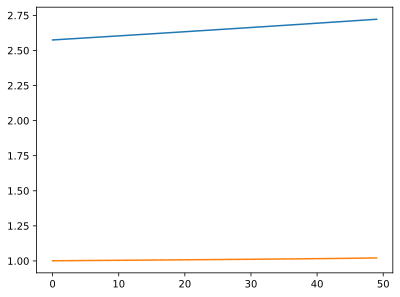

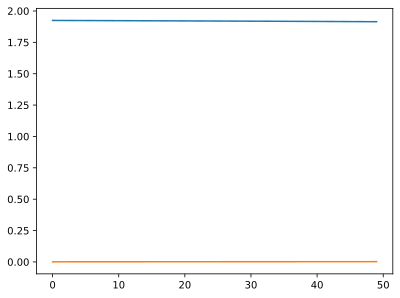

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.11627906976744186


|██████████| 100.0% ◆ elapsed 270.10ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 141.32ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 266.03ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 271.23ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 259.03ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 280.18ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 234.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 245.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 255.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 230.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 251.63ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 267.61ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 237.32ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 225.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 139.02ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 236.46ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 237.01ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 255.93ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 246.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 241.30ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 236.28ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 150.68ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 242.75ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 136.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 251.94ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 233.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 117.72ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 245.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 274.50ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 239.23ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 125.24ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 108.02ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 139.88ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 248.06ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 260.89ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 254.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 225.76ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 234.09ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 156.31ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 228.22ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 252.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 255.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 238.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 266.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 270.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 254.54ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 229.90ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 246.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 160.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11627906976744186


|██████████| 100.0% ◆ elapsed 81.60ms ◆ remaining 0.00ms


####### 8.6 #######


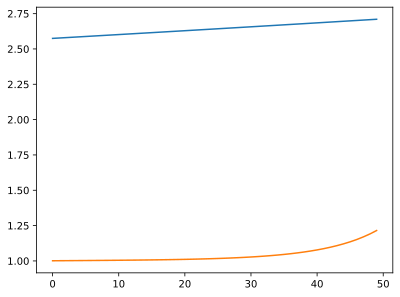

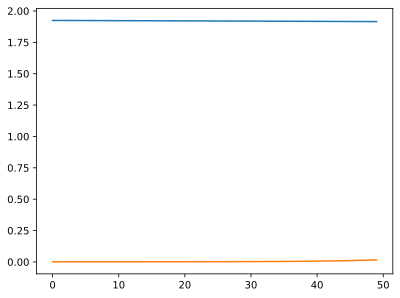

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.1149425287356322


|██████████| 100.0% ◆ elapsed 76.40ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 156.64ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 228.37ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 212.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 85.46ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 104.71ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 229.26ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 253.15ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 248.72ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 240.15ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 128.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 271.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 244.04ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 245.11ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 258.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 253.13ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 227.17ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 271.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 248.58ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 237.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 231.54ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 139.60ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 226.54ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 231.73ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 139.36ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 252.29ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 253.96ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 237.27ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 260.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 223.03ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 251.97ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 129.90ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 241.96ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 221.13ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 120.47ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 259.71ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 245.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 125.56ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 249.37ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 260.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 245.43ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 259.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 147.90ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 213.06ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 251.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 254.77ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 241.01ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 234.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 144.45ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1149425287356322


|██████████| 100.0% ◆ elapsed 247.56ms ◆ remaining 0.00ms  


####### 8.7 #######


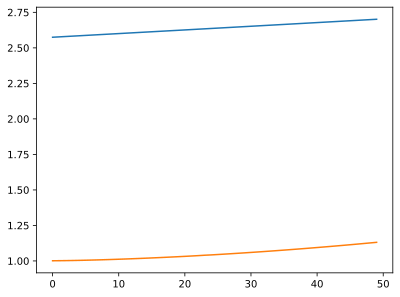

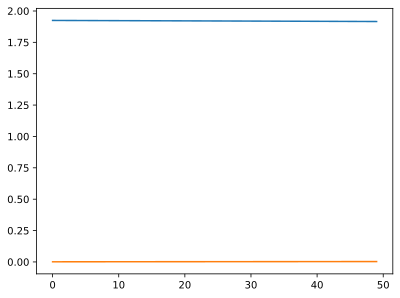

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.11363636363636362


|██████████| 100.0% ◆ elapsed 243.61ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 250.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 234.57ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 232.08ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 264.43ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 232.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 128.05ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 263.21ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 251.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 240.73ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 237.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 244.48ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 239.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 235.10ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 244.23ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 245.39ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 236.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 250.93ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 243.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 250.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 122.51ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 241.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 229.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 123.76ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 263.60ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 233.71ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 224.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 251.40ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 249.17ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 246.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 125.89ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 151.88ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 80.19ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 173.41ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 169.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 96.20ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 180.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 249.76ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 263.52ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 239.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 240.23ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 140.76ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 238.08ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 228.49ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 260.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 253.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 243.89ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 243.21ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 149.14ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11363636363636362


|██████████| 100.0% ◆ elapsed 254.55ms ◆ remaining 0.00ms  


####### 8.8 #######


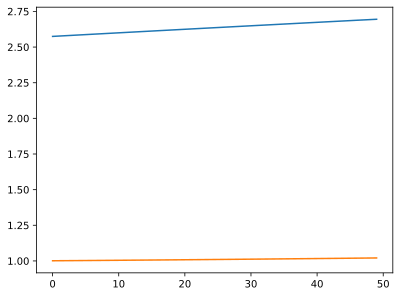

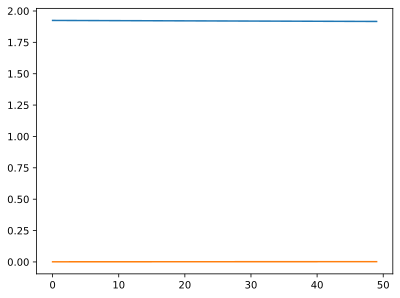

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.11235955056179775


|██████████| 100.0% ◆ elapsed 175.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 106.90ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 137.05ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 222.14ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 255.64ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 74.17ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 132.76ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 259.50ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 235.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 222.49ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 238.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 244.08ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 216.46ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 223.85ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 246.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 221.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 78.35ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 149.19ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 240.37ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 239.56ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 225.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 261.67ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 224.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 228.25ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 149.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 236.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 226.86ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 225.97ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 260.46ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 220.69ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 235.67ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 246.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 237.12ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 233.37ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 243.73ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 249.85ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 224.22ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 126.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 265.57ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 229.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 232.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 247.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 241.95ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 252.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 261.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 263.74ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 234.04ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 116.07ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 280.44ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11235955056179775


|██████████| 100.0% ◆ elapsed 221.23ms ◆ remaining 0.00ms  


####### 8.9 #######


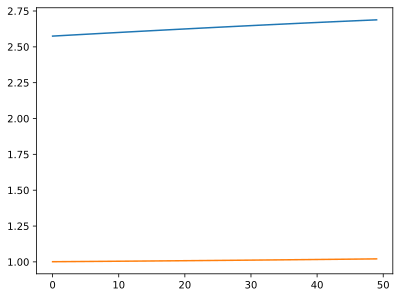

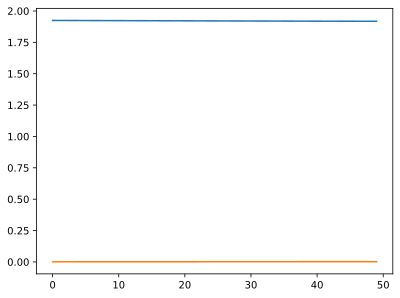

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.1111111111111111


|██████████| 100.0% ◆ elapsed 239.97ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 251.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 241.09ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 256.75ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 143.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 226.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 224.20ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 140.11ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 242.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 245.87ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 123.39ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 258.94ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 235.30ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 118.53ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 248.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 228.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 123.25ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 260.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 267.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 236.63ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 268.14ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 219.02ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 264.75ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 229.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 256.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 77.77ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 154.79ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 243.94ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 227.09ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 245.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 232.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 243.36ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 259.18ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 266.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 243.70ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 223.92ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 256.51ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 221.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 128.95ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 276.91ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 219.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 122.44ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 265.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 263.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 223.88ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 114.82ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 252.10ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 248.64ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 227.09ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1111111111111111


|██████████| 100.0% ◆ elapsed 260.34ms ◆ remaining 0.00ms  


####### 9.0 #######


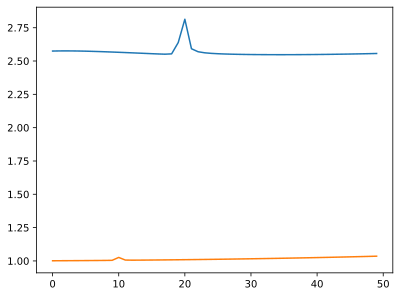

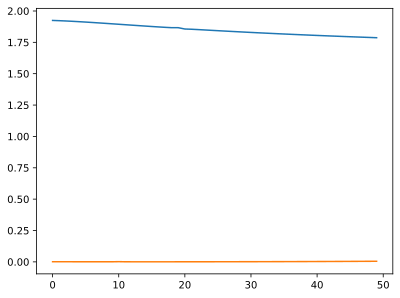

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.1098901098901099


|██████████| 100.0% ◆ elapsed 259.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 247.65ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 236.95ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 120.84ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 251.57ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 216.74ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 115.93ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 243.79ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 234.50ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 228.46ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 262.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 257.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 213.67ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 222.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 145.82ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 140.51ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 90.63ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 155.06ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 240.96ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 231.03ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 110.78ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 255.67ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 242.85ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 230.32ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 241.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 255.01ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 215.94ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 255.01ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 260.18ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 241.58ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 239.45ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 151.80ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 219.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 236.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 271.88ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 230.36ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 213.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 134.77ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 244.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 232.90ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 130.93ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 271.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 238.44ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 230.48ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 143.37ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 226.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 229.25ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 125.45ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 140.74ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1098901098901099


|██████████| 100.0% ◆ elapsed 71.10ms ◆ remaining 0.00ms


####### 9.1 #######


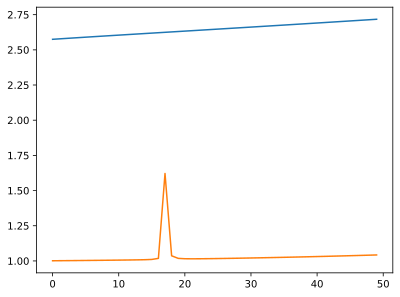

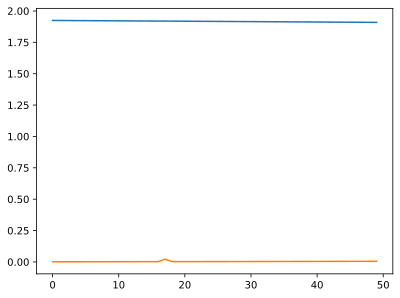

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.10869565217391305


|██████████| 100.0% ◆ elapsed 255.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 269.11ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 219.35ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 241.16ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 148.35ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 238.76ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 219.85ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 257.75ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 244.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 226.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 243.30ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 142.95ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 70.61ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 121.43ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 242.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 260.69ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 119.44ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 242.68ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 245.61ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 224.36ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 249.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 264.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 240.22ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 223.32ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 272.07ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 229.26ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 239.74ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 269.20ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 246.22ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 125.47ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 263.02ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 259.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 232.39ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 249.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 264.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 250.90ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 228.43ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 262.43ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 213.28ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 223.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 137.30ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 268.51ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 237.69ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 169.06ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 247.38ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 236.47ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 236.51ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 240.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 243.68ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10869565217391305


|██████████| 100.0% ◆ elapsed 230.07ms ◆ remaining 0.00ms 


####### 9.2 #######


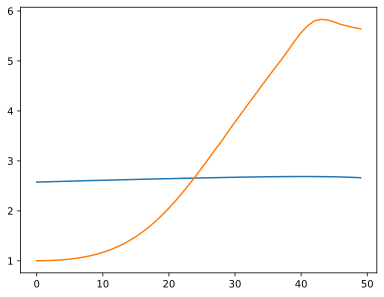

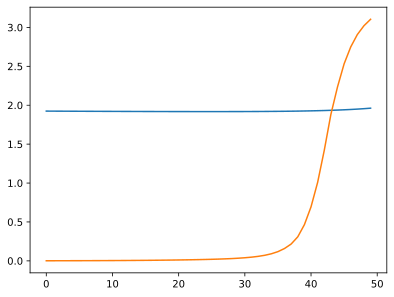

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.1075268817204301


|██████████| 100.0% ◆ elapsed 230.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 238.69ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 210.37ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 206.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 221.33ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 205.06ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 204.08ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 85.03ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 145.18ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 197.63ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 213.37ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 230.57ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 197.61ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 204.02ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 232.22ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 203.01ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 203.30ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 219.35ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 231.53ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 201.03ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 210.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 229.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 205.66ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 211.16ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 228.13ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 209.80ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 205.17ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 225.12ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 224.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 214.39ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 201.23ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 222.66ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 207.72ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 190.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 221.12ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 206.09ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 217.75ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 223.35ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 206.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 199.82ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 208.37ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 202.91ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 210.30ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 239.43ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 218.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 209.63ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 217.65ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 234.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 192.93ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.1075268817204301


|██████████| 100.0% ◆ elapsed 202.73ms ◆ remaining 0.00ms 


####### 9.3 #######


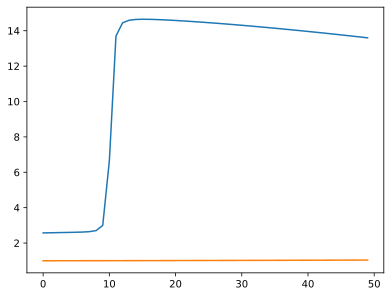

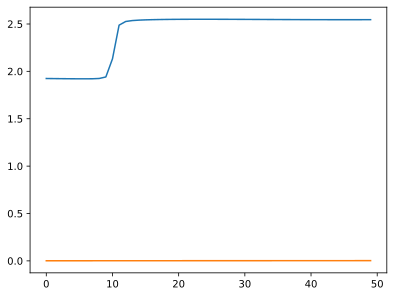

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.10638297872340426


|██████████| 100.0% ◆ elapsed 236.63ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 225.89ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 200.90ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 199.48ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 228.28ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 204.43ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 201.00ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 227.95ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 218.25ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 203.20ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 230.17ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 218.63ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 200.08ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 205.91ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 222.84ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 197.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 205.68ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 246.87ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 223.40ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 65.95ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 138.95ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 224.36ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 215.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 196.96ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 229.76ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 201.54ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 207.08ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 130.07ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 203.78ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 203.28ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 229.78ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 229.19ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 225.47ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 243.36ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 235.94ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 221.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 216.12ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 224.66ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 235.78ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 227.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 225.47ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 221.84ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 224.03ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 205.07ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 224.41ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 211.22ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 201.14ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 232.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 193.12ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10638297872340426


|██████████| 100.0% ◆ elapsed 223.39ms ◆ remaining 0.00ms  


####### 9.4 #######


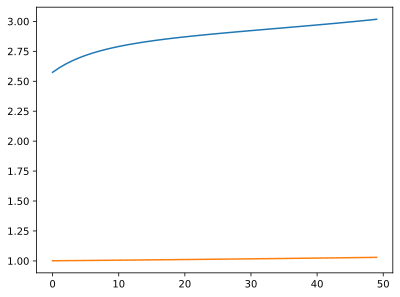

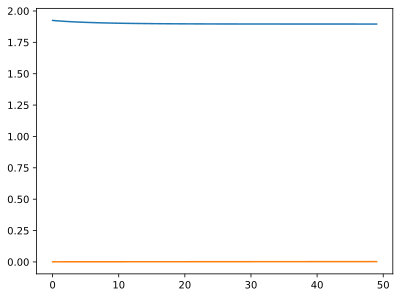

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913
(100, 100)
0.10526315789473685


|██████████| 100.0% ◆ elapsed 220.62ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 217.76ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 206.01ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 209.91ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 236.59ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 210.69ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 210.21ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 213.29ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 196.01ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 213.09ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 222.83ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 216.09ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 206.75ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 205.81ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 232.70ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 201.67ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 201.62ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 230.46ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 213.15ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 200.50ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 235.32ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 226.28ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 213.50ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 210.69ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 227.36ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 197.40ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 214.98ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 231.51ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 198.21ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 201.73ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 236.64ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 232.48ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 201.86ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 211.35ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 235.80ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 197.33ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 194.94ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 232.28ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 204.91ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 204.80ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 227.34ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 209.76ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 200.47ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 228.85ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 227.35ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 211.50ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 200.64ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 229.05ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 190.00ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.10526315789473685


|██████████| 100.0% ◆ elapsed 211.41ms ◆ remaining 0.00ms 


####### 9.5 #######


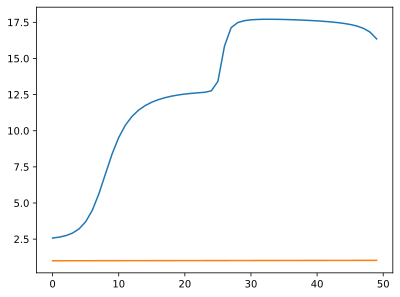

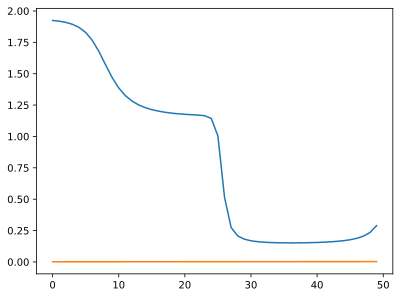

In [400]:
branches_for_diff_omega_d_phi = []
branches_for_diff_omega_d_nue = []

for i in omega_d_list:
    omega_d = round(i,3)
    Hamiltonian = qubit_drive_strength(Omega_d = omega_d)
    # The hamiltonian function returns all the required hamiltonians.
    H_sc = Hamiltonian["H_sc"] ### Time dependent hamiltonian for each
    H_0 = Hamiltonian["H_0"] ### Hamiltonian with the coupling
    H_0 = dq.to_numpy(H_0)
    eval_0, evec_0 = np.linalg.eigh(H_0)
    print(H_0.shape)
    H_phi = Hamiltonian["H_phi"] ### Hamiltonian of the qubit.
    H_phi = dq.to_numpy(H_phi)
    eval_phi , evec_phi = np.linalg.eigh(H_phi)
    H_nue = Hamiltonian["H_nue"] ### Hamiltonian of an array.
    H_nue = dq.to_numpy(H_nue)
    eval_nue, evec_nue = np.linalg.eigh(H_nue)
    H_bare =  H_phi + H_nue
    eval_bare , evec_bare = np.linalg.eigh(H_bare)
    H_phi_ = Hamiltonian["H_phi_"] ### Hamiltonian of the qubit.
    H_phi_ = dq.to_numpy(H_phi_)
    eval_phi_ , evec_phi_ = np.linalg.eigh(H_phi_)
    H_nue_ = Hamiltonian["H_nue_"] ### Hamiltonian of an array.
    H_nue_ = dq.to_numpy(H_nue_)
    eval_nue_, evec_nue_ = np.linalg.eigh(H_nue_) # Hamiltonian without the tensor product with the array Identity .

    evec_H_0_bare_bare = dq.tensor(evec_phi_, evec_nue_).to_numpy() # the bare phi and neu to form the |k> x |n>

    n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
    I_nue = dq.eye(5)
    n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)

    '''This the loop where we first find the |k^~,n^~> labels so we compare the overlap between the bare bare |k> x |n> eigenstates and the eigenstates of the dressed hamiltonian.
    We extract eigenstates one by one (i loop) for the bare bare hamiltonian which is stored in the "evec_H_0_bare_bare" this has 100 eigenstates of shape (100,) [Hamiltonian of size 20X5] .
    The temp variable is a temoraray variable to check the overlap, in the paper they have used a standard where the overlap is over 0.8 , so temp = 0.8 would have made more sense but some overlaps are lower than that around ~0.6-0.7ish .
    In the j loop we extract the eigenstates of the dressed hamiltonian that have the same shape as that of the eigenstates of the bare bare eigenstates then we check overlap.
    We check overlap using the standard method of finding the inner product with the eigenstates for each dressed state with each bara bare state for which we use the numpy vdot that takes
    the conjuagte transpose of the first argument and takes the inner product with the second aremugument then we take the square of this .
    We use the if condition to compare the overlaps and store the index of the maximum overlap and its value , we don't need the value of the exact overlap in further computation but can be used for useful check.
    "index" contains the list of indexes for the bare states corresponding dressed state so the first index of "index" contains the index of the dreesed eigenstate that has max overlap with the bare bare 0.
    "overlaps" contain the list of overlaps'''
    # index = []
    # overlaps = []
    # for j in range(0, (len(evec_0)- 1)):
    #     y = evec_0[:, j]
    
    #     #print(x)
    #     temp = 0.0 # PJ - can be 0.8?
    #     for i in range(0, (len(evec_H_0_bare_bare)-1)):
    #         x = evec_H_0_bare_bare[:, i]
    #         overlap = np.vdot(x, y)
    #         overlap_prob = np.abs(overlap) ** 2
    #         if overlap_prob > temp:
    #             temp = overlap_prob
    #             temp_idx = i
    #     index.append(temp_idx) # PJ - print index and check if there is any repetition
    #     overlaps.append(temp)

    '''Here we now evaluate the floquet results of the H_sc for each photon number we go from 0 to 49
    "T" is the time period for which our driven time dependent hamiltonian is period 2*pi/omega_d.
    "tsave" is the timesteps for which micro energies are being stored (not really imporatant for our pursose, we care about quasienergioes at t0)
    dynamiqs' floquet function is used for this that takes 3 arguments the time dependent hamiltonian at each photon number, time period (T) and "tsave" .
    We store the floquet results in the list floquet_states'''
    floquet_states = []
    for i in range(0, 50):
        T = (np.pi * 2)/ Hamiltonian["omega_d"]
        print(T)
        H_sc_i = H_sc[i]
        tsave = np.linspace(0, T, 1)
        floquet_state =  dq.floquet(H_sc_i, T, tsave)
        floquet_states.append(floquet_state)



    '''Now we check the overlap of the floquet eigenstates(modes) with the dressed eigenstates'''
    overlap_coup = []
    index_coup = []
    index_coup_wrt_n = []

    current_refs = list(evec_0[:3])   # seed: reference states start as the n̄_r=0 eigenstates

    for n, i in enumerate(floquet_states):
        index_coup = []
        new_refs = []
        n_modes = i.modes.shape[1]        # use actual dimension, not hardcoded 100; PJ - why?

        for l, k in enumerate(current_refs):   # <-- compare against current_refs (i_{l-1}), not evec_0
            temp = -1.0                        # <-- no 0.5 gate; Eq. 7 is an unconditional argmax
            temp_idx = None                    # <-- reset every l, fixes the stale-index bug

            for j in range(n_modes):
                x = i.modes[0, j]
                overlap = np.vdot(k, x)
                overlap_prob = np.abs(overlap)**2
                if overlap_prob > temp:
                    temp = overlap_prob
                    temp_idx = j

            index_coup.append(temp_idx)
            overlap_coup.append(temp)
            new_refs.append(i.modes[0, temp_idx])   # <-- carry this step's winner forward as next step's reference

        index_coup_wrt_n.append(index_coup)
        current_refs = new_refs


    n_phi_per_branch = []
    n_nue_per_branch = []

    n_branches = len(index_coup_wrt_n[0])   # number of tracked branches (e.g. 3)
    n_steps = len(floquet_states)           # actual n̄_r range, not hardcoded

    for l in range(n_branches):
        n_phi_branch = []
        n_nue_branch = []
        for n in range(n_steps):
            idx = index_coup_wrt_n[n][l]              # this branch's mode index at step n
            state = floquet_states[n].modes[0, idx]
            n_phi = dq.expect(n_phi_operator_full, state)
            n_nue = dq.expect(Hamiltonian["n_nue"], state)
            n_phi_branch.append(float(n_phi.real))
            n_nue_branch.append(float(n_nue.real))
        n_phi_per_branch.append(n_phi_branch)
        n_nue_per_branch.append(n_nue_branch)

    branches_for_diff_omega_d_phi.append(n_phi_per_branch)
    branches_for_diff_omega_d_nue.append(n_nue_per_branch)



    print("#######",omega_d,"#######")
    for i in range(0,(len(n_phi_per_branch) -1)):
        plt.plot(n_phi_per_branch[i])
    plt.show()
    # for i in range(0, 3):#(len(n_phi_per_branch) -1)):
    #     plt.plot(n_phi_per_branch[i])
    # plt.show()
    for i in range(0, (len(n_nue_per_branch) -1)):
        plt.plot(n_nue_per_branch[i])
    plt.show()
    # for i in range(0, 3):# (len(n_nue_per_branch) -1)):
    #     plt.plot(n_nue_per_branch[i])
    plt.show()



In [171]:
omega_d_list

array([8.9 , 8.95, 9.  , 9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 ,
       9.45, 9.5 ])

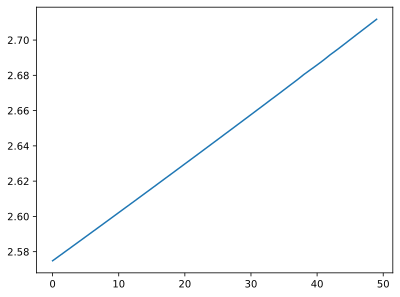

In [325]:
for i in range(0,(len(n_phi_per_branch) )):
        plt.plot(n_phi_per_branch[i])
plt.show()

In [ ]:
x_1 = np.zeros((13, 50), dtype = float)
xx_1 = np.zeros((13, 50), dtype = float)

for i in range(0,13):
    for j in range(0,50):
        l = branches_for_diff_omega_d_phi[i][0][j]
        x_1[i][j] = l
        m = branches_for_diff_omega_d_nue[i][1][j]
        xx_1[i][j] = m


nbar_vals = np.arange(0, 50)     

In [173]:

#omega_d_vals = np.linspace(8.5, 9.5, 100)   # GHz
nbar_vals = np.arange(0, 50)                 # n̄_r steps

In [174]:
np.log(x_1.T )

 /tmp/ipykernel_1078063/2439165734.py: 1

array([[-5.86241074, -5.86248122, -5.86243374, -5.86249235, -5.86249899,
        -5.86251348, -5.86241704, -5.86242155, -5.86288832, -5.86383393,
        -5.86227741,        -inf,        -inf],
       [-5.61651283, -5.62922054, -5.64068372, -5.65113461, -5.66126568,
        -5.67122712, -5.68193651, -5.69563832, -5.72400418, -5.64076989,
        -5.68621923,        -inf,        -inf],
       [-5.41787409, -5.44037869, -5.45908021, -5.47675554, -5.4938643 ,
        -5.51083007, -5.52931474, -5.55323331, -5.59828042, -5.45563308,
        -5.53673454,        -inf,        -inf],
       [-5.25111003, -5.28169099, -5.30535758, -5.32829122, -5.35054726,
        -5.37279177, -5.39682047, -5.42965494, -5.48375497, -5.29624455,
        -5.4061496 ,        -inf,        -inf],
       [-5.10720284, -5.1431797 , -5.1720971 , -5.19917993, -5.22517008,
        -5.25167609, -5.2799347 , -5.32051603, -5.38049877, -5.15474839,
        -5.29077361,        -inf,        -inf],
       [-4.98056871, -5.021932

In [176]:
floor = 1e-20   # avoid log(0)
log_n_phi = np.log(x_1.T )
log_n_nue  = np.log(xx_1.T)

 /tmp/ipykernel_1078063/2494416532.py: 2RuntimeWarning: divide by zero encountered in log
 /tmp/ipykernel_1078063/2494416532.py: 3

In [177]:
import matplotlib.colors as colors

In [178]:
np.max(np.transpose(log_n_phi))

np.float64(1.669474808437061)

In [179]:
cmin=10**(-4)
cmid=1
cmax=np.max(np.transpose(xx_1.T ))

In [180]:
cmax

np.float64(0.02136726677417755)

In [181]:
len(omega_d_list)
omega_d_list

array([8.9 , 8.95, 9.  , 9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 ,
       9.45, 9.5 ])

Figure saved as: floquet.pdf


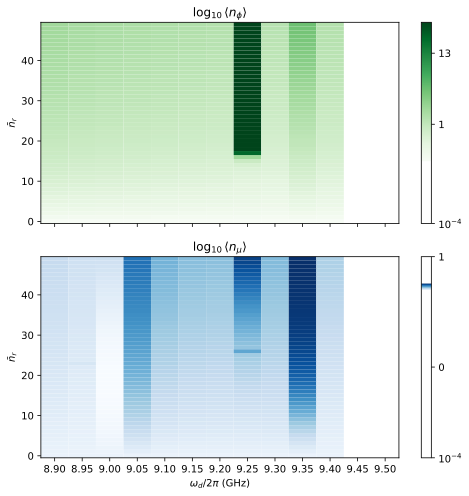

In [ ]:
x_1 = np.zeros((13, 50), dtype = float)
xx_1 = np.zeros((13, 50), dtype = float)

for i in range(0,13):
    for j in range(0,50):
        l = branches_for_diff_omega_d_phi[i][0][j]
        x_1[i][j] = l
        m = branches_for_diff_omega_d_nue[i][1][j]
        xx_1[i][j] = m


nbar_vals = np.arange(0, 50)  
floor = 1e-20   # avoid log(0)
log_n_phi = np.log(x_1.T )
log_n_nue  = np.log(xx_1.T)
len(omega_d_list)
omega_d_list
fig, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=True)

im0 = axes[0].pcolormesh(omega_d_list, nbar_vals, log_n_phi, shading = 'auto' , cmap='Greens')#, norm = colors.LogNorm(vmin = 1e-4, vmax = 17))
axes[0].set_ylabel(r'$\bar{n}_r$')
axes[0].set_title(r'$\log_{10}\langle n_\phi \rangle$')
axes[0].set_xticks([8.9 , 8.95, 9.  , 9.05, 9.1 , 9.15, 9.2 , 9.25, 9.3 , 9.35, 9.4 ,
       9.45, 9.5 ])
cbar = plt.colorbar(im0)
cbar.ax.set_yticks([np.log(cmin),np.log(cmid),np.log(cmax)],[r"$10^{-4}$",r"$13$",r"$1$"],fontsize=10)
im1 = axes[1].pcolormesh(omega_d_list, nbar_vals, log_n_nue * 1e-1,
                          shading='auto', cmap='Blues')#, norm =2colors.LogNorm(vmin = 1e-4, vmax = 1))
axes[1].set_xlabel(r'$\omega_d/2\pi$ (GHz)')
axes[1].set_ylabel(r'$\bar{n}_r$')
axes[1].set_title(r'$\log_{10}\langle n_\mu \rangle$')
#fig.colorbar(im1)
cbar = plt.colorbar(im1)
cbar.ax.set_yticks([np.log(1e-4),np.log(1e-2),1],[r"$10^{-4}$",r"$0$",r"$1$"],fontsize=10)
#cbar.set_ticklabels([r"$10^{-4}$","1"])
filename = f"floquet.pdf"

fig.savefig(filename, bbox_inches='tight')
print(f"Figure saved as: {filename}")
plt.tight_layout()
plt.show()

TypeError: Dimensions of C (11, 50) should be one smaller than X(11) and Y(50) while using shading='flat' see help(pcolormesh)

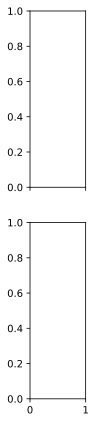

In [145]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

fig, axes = plt.subplots(2, 1, figsize=(1, 7), sharex=True)

# --- phi ---
im0 = axes[0].pcolormesh(
    omega_d_list,
    nbar_vals,
    log_n_phi.T,
    shading='auto',
    cmap='Greens',
    norm=colors.Normalize(
        vmin=-4.60517,
        vmax=-2.61599
    )
)

axes[0].set_ylabel(r'$\bar{n}_r$')
axes[0].set_title(r'$\ln\langle n_\phi\rangle$')

cbar0 = fig.colorbar(im0, ax=axes[0])
cbar0.set_ticks([
    np.log(1e-2),
    np.log(1e-1),
    np.log(1)
])
cbar0.set_ticklabels([
    r'$10^{-2}$',
    r'$10^{-1}$',
    r'$10^{0}$'
])


# --- nue ---
im1 = axes[1].pcolormesh(
    omega_d_list,
    nbar_vals,
    log_n_nue.T,
    shading='auto',
    cmap='Blues',
    norm=colors.Normalize(
        vmin=-4.60517,
        vmax=-2.61599
    )
)

axes[1].set_xlabel(r'$\omega_d/2\pi$ (GHz)')
axes[1].set_ylabel(r'$\bar{n}_r$')
axes[1].set_title(r'$\ln\langle n_\mu\rangle$')

cbar1 = fig.colorbar(im1, ax=axes[1])
cbar1.set_ticks([
    np.log(1e-2),
    np.log(1e-1),
    np.log(1)
])
cbar1.set_ticklabels([
    r'$10^{-2}$',
    r'$10^{-1}$',
    r'$10^{0}$'
])

axes[0].set_xticks([8.5, 9.0, 9.5])

plt.tight_layout()

filename = "floquet.pdf"
fig.savefig(filename, bbox_inches='tight')
print(f"Figure saved as: {filename}")

plt.show()

In [72]:
print(log_n_phi.min(), log_n_phi.max())
print(log_n_nue.min(), log_n_nue.max())
print(np.sum(log_n_phi <= 0), np.sum(log_n_nue <= 0))
print(np.isnan(log_n_phi).sum(), np.isnan(log_n_nue).sum())

-4.605170185988091 -2.6159894865042186
-4.605170185988091 -4.605170185988091
550 550
0 0


In [365]:
Hamiltonian = qubit_drive_strength(8.58)

(100, 100)
(100, 100)


 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

1.3907764387314137
0.35951141109067913


In [366]:
H_sc = Hamiltonian["H_sc"] ### Time dependent hamiltonian for each
H_0 = Hamiltonian["H_0"] ### Hamiltonian with the coupling
H_0 = dq.to_numpy(H_0)
eval_0, evec_0 = np.linalg.eigh(H_0)
print(H_0.shape)
H_phi = Hamiltonian["H_phi"] ### Hamiltonian of the qubit.
H_phi = dq.to_numpy(H_phi)
eval_phi , evec_phi = np.linalg.eigh(H_phi)
H_nue = Hamiltonian["H_nue"] ### Hamiltonian of an array.
H_nue = dq.to_numpy(H_nue)
eval_nue, evec_nue = np.linalg.eigh(H_nue)
H_bare =  H_phi + H_nue
eval_bare , evec_bare = np.linalg.eigh(H_bare)

(100, 100)


In [367]:
H_phi_ = Hamiltonian["H_phi_"] ### Hamiltonian of the qubit.
H_phi_ = dq.to_numpy(H_phi_)
eval_phi_ , evec_phi_ = np.linalg.eigh(H_phi_)
H_nue_ = Hamiltonian["H_nue_"] ### Hamiltonian of an array.
H_nue_ = dq.to_numpy(H_nue_)
eval_nue_, evec_nue_ = np.linalg.eigh(H_nue_)

In [368]:
evec_H_0_bare_bare = dq.tensor(evec_phi_, evec_nue_).to_numpy()

In [369]:
index = []
overlaps = []
for i in range(0, (len(evec_H_0_bare_bare)-1)):
    x = evec_H_0_bare_bare[:, i]
    #print(x)
    temp = 0.0
    for j in range(0, (len(evec_0)- 1)):
        y = evec_0[:, j]
        overlap = np.vdot(x, y)
        overlap_prob = np.abs(overlap) ** 2
        if overlap_prob > temp:
            temp = overlap_prob
            temp_idx = j
    index.append(temp_idx)
    overlaps.append(temp)





###WE HAVE COMPARED THE EIGENSTATES OF THE BARE AND COUPLED HAMILTONIAN NEXT WE COMPARE THE FLOQUET EIGENSTATES AND FORM BRANCHES#####

FOR THIS WE WILL FIND THE FLOQUET EIGENSTATES FOR EACH PHHTON NUMBER FROM 0 TO 50 AS WE HAVE FORMED THE H_sc Hamiltonian for each photon number and then loop that


In [370]:
floquet_states = []
for i in range(0, 50):
    T = (np.pi * 2)/ Hamiltonian["omega_d"]
    print(T)
    H_sc_i = H_sc[i]
    tsave = np.linspace(0, T, 4)
    floquet_state =  dq.floquet(H_sc_i, T, tsave)
    floquet_states.append(floquet_state)

0.11655011655011654


|██████████| 100.0% ◆ elapsed 85.85ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 110.68ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 205.57ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 75.20ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 78.37ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 155.60ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 258.82ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 275.42ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 72.97ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 148.73ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 258.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 301.37ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 141.51ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 252.73ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 117.50ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 269.71ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 246.63ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 228.62ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 119.39ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 80.70ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 124.26ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 238.39ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 132.58ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 157.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 101.56ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 133.86ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 85.94ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 119.53ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 162.71ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 98.13ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 101.85ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 156.86ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 250.49ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 88.24ms ◆ remaining 0.00ms
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 165.46ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 232.31ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 248.58ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 241.00ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 209.04ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 206.34ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 260.81ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 230.55ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 257.09ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 266.54ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 225.74ms ◆ remaining 0.00ms 
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 240.98ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 262.58ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 243.24ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 246.40ms ◆ remaining 0.00ms  
 /home/w_lab_qumac/miniconda/envs/dq_gpu/lib/python3.12/site-packages/dynamiqs/qarrays/qarray.py: 547

0.11655011655011654


|██████████| 100.0% ◆ elapsed 263.15ms ◆ remaining 0.00ms  


COMPARING THE FLOQUET EIGENSTATES WITH THE EIGENSTATES OF THE COUPLED SYSTEM.

In [ ]:
print(evec_0[1][0])

(1.110223e-16+0j)


In [371]:
overlap_coup = []
index_coup = []
index_coup_wrt_n = []

current_refs = list(evec_0)   # seed: reference states start as the n̄_r=0 eigenstates

for n, i in enumerate(floquet_states):
    index_coup = []
    new_refs = []
    n_modes = i.modes.shape[1]        # use actual dimension, not hardcoded 100

    for l, k in enumerate(current_refs):   # <-- compare against current_refs (i_{l-1}), not evec_0
        temp = -1.0                        # <-- no 0.5 gate; Eq. 7 is an unconditional argmax
        temp_idx = None                    # <-- reset every l, fixes the stale-index bug

        for j in range(n_modes):
            x = i.modes[0, j]
            overlap = np.vdot(k, x)
            overlap_prob = np.abs(overlap)**2
            if overlap_prob > temp:
                temp = overlap_prob
                temp_idx = j

        index_coup.append(temp_idx)
        overlap_coup.append(temp)
        new_refs.append(i.modes[0, temp_idx])   # <-- carry this step's winner forward as next step's reference

    index_coup_wrt_n.append(index_coup)
    current_refs = new_refs                     # <-- this line is the actual Eq. 7 recursion

In [372]:

n_phi_operator = evec_phi_@ np.diag(np.arange(evec_phi_.shape[1]))  @ (evec_phi_.conj().T)
I_nue = dq.eye(5)
n_phi_operator_full = dq.tensor(n_phi_operator, I_nue)

In [373]:
n_phi_all_per_n = []
n_nue_all = []
for n in range(0,50):
    n_phi_all = []
    for i in index_coup_wrt_n:
        #print(n , i[n])
        n_phi =  dq.expect(n_phi_operator_full, floquet_states[n].modes[0, i[n]])
        n_nue = dq.expect(Hamiltonian["n_nue"], floquet_states[n].modes[0, index_coup_wrt_n[n][0]])
        n_phi_all.append(float(n_phi.real))
    n_phi_all_per_n.append(n_phi_all)

In [375]:
n_phi_per_branch = []
n_nue_per_branch = []

n_branches = len(index_coup_wrt_n[0])   # number of tracked branches (e.g. 3)
n_steps = len(floquet_states)           # actual n̄_r range, not hardcoded

for l in range(n_branches):
    n_phi_branch = []
    n_nue_branch = []
    for n in range(n_steps):
        idx = index_coup_wrt_n[n][l]              # this branch's mode index at step n
        state = floquet_states[n].modes[0, idx]
        n_phi = dq.expect(n_phi_operator_full, state)
        n_nue = dq.expect(Hamiltonian["n_nue"], state)
        n_phi_branch.append(float(n_phi.real))
        n_nue_branch.append(float(n_nue.real))
    n_phi_per_branch.append(n_phi_branch)
    n_nue_per_branch.append(n_nue_branch)

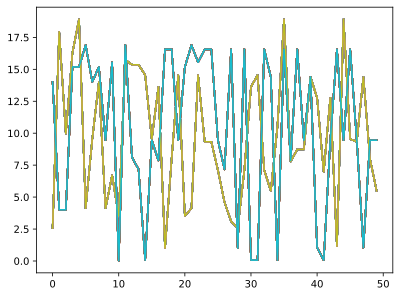

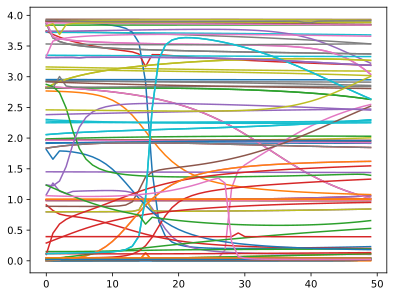

In [391]:
import matplotlib.pyplot as plt
for i in range(0, (len(n_phi_per_branch) -30)):
    plt.plot(n_phi_all_per_n[0])
    plt.plot(n_phi_all_per_n[13])
plt.show()
for i in range(0, (len(n_nue_per_branch) -1)):
    plt.plot(n_nue_per_branch[i])
plt.show()


index_coup_wrt_n CONTAINS THE LIST OF LISTS OF INDEXS OF FLOQUET EIGENSTATES WITH THE MAXIMUM OVERLAP WITH THE EIGENSTATES OF THE coupled hamiltonian.

floquet_states contain the floquet result of each H_sc from photon number 0 to 49 , each floquet_state contains the result of H_sc for the particular photon number

In [ ]:
floquet_states[0]

FloquetResult(
  tsave=f32[4],
  method=Tsit5(
    rtol=weak_f32[],
    atol=weak_f32[],
    safety_factor=weak_f32[],
    min_factor=weak_f32[],
    max_factor=weak_f32[]
  ),
  gradient=None,
  options=Options(
    save_states=bool[],
    save_propagators=bool[],
    cartesian_batching=bool[],
    progress_meter=TqdmProgressMeter(),
    nmaxclick=weak_i32[],
    vectorized=bool[]
  ),
  _saved=FloquetSaved(
    ysave=DenseQArray(dims=(20, 5), vectorized=False, data=c64[4,100,100,1]),
    extra=None,
    quasienergies=f32[100]
  ),
  infos=AdaptiveStepInfos(
    nsteps=weak_i32[], naccepted=weak_i32[], nrejected=weak_i32[]
  ),
  T=weak_f32[]
)

quasienergies with respect to the respective mode per photon number.

In [25]:
quasienergies_related_to_coup_per_n = []
for n, i in enumerate(index_coup_wrt_n):



    quasienergies_per_photon_number = floquet_states[n].quasienergies
    quasienergies_related_to_coup = []
    for j in i:


        quasienergies_related_to_coup.append(float(quasienergies_per_photon_number[j]))
    quasienergies_related_to_coup_per_n.append(quasienergies_related_to_coup)




In [29]:
quasienergies_related_to_coup_per_n[0][0]

-1.5525381565093994

In [30]:
transition_energy_per_n =[]
for n, i in enumerate(quasienergies_related_to_coup_per_n):
    transition_energies = []
    for j in range(0,(len(i)-1)):

        transition_energy = i[j+1] - i[j]
        transition_energies.append(transition_energy)

    transition_energy_per_n.append(transition_energies)

In [31]:
for i in range(0,10):
    print(transition_energy_per_n[i])

[0.0288698673248291, -2.6066064834594727, 0.5654165744781494]
[0.028561830520629883, -2.6067891120910645, 0.5639169216156006]
[0.02825021743774414, -2.606968879699707, 0.5624213218688965]
[0.027942657470703125, -2.607151508331299, 0.5609261989593506]
[0.027631044387817383, -2.607334613800049, 0.5594384670257568]
[0.027319908142089844, -2.6075167655944824, 0.5579550266265869]
[0.027009963989257812, -2.6076979637145996, 0.5564711093902588]
[0.026702165603637695, -2.6078832149505615, 0.5549960136413574]
[0.026388883590698242, -2.608064889907837, 0.553523063659668]
[0.02607870101928711, -2.608248710632324, 0.552055835723877]


[0.0288698673248291, -2.6066064834594727, 0.5654165744781494]
[0.028561830520629883, -2.6067891120910645, 0.5639169216156006]
[0.02825021743774414, -2.606968879699707, 0.5624213218688965]
[0.027942657470703125, -2.607151508331299, 0.5609261989593506]
[0.027631044387817383, -2.607334613800049, 0.5594384670257568]
[0.027319908142089844, -2.6075167655944824, 0.5579550266265869]
[0.027009963989257812, -2.6076979637145996, 0.5564711093902588]
[0.026702165603637695, -2.6078832149505615, 0.5549960136413574]
[0.026388883590698242, -2.608064889907837, 0.553523063659668]
[0.02607870101928711, -2.608248710632324, 0.552055835723877]


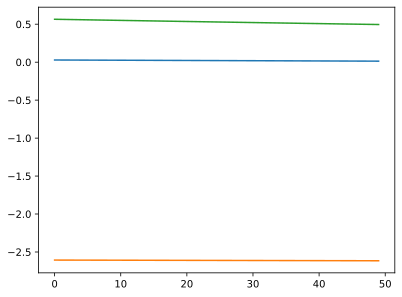

In [33]:
quasienergies_related_to_coup_per_n = []
for n, i in enumerate(index_coup_wrt_n):



    quasienergies_per_photon_number = floquet_states[n].quasienergies
    quasienergies_related_to_coup = []
    for j in i:


        quasienergies_related_to_coup.append(float(quasienergies_per_photon_number[j]))
    quasienergies_related_to_coup_per_n.append(quasienergies_related_to_coup)




transition_energy_per_n =[]
for n, i in enumerate(quasienergies_related_to_coup_per_n):
    transition_energies = []
    for j in range(0,(len(i)-1)):

        transition_energy = i[j+1] - i[j]
        transition_energies.append(transition_energy)

    transition_energy_per_n.append(transition_energies)

for i in range(0,10):
    print(transition_energy_per_n[i])
plt.plot(transition_energy_per_n)

In [ ]:
H_o = []
eval_o = []
estat_o = []
save = []
temp = 0.9
temp_idx = 0

floquet_states_for_all_flx_states = []
for i in range(0, 5):
    #x = dq.fock((20, 5), [i, 0])
    x_dag = dq.tensor(evec_phi_, evec_nue_).to_numpy()[i]
    #x_dag = x.dag().to_numpy()
    overlap = np.argmax((x_dag @ evec_0) **2)
    if overlap > temp:
        temp = overlap
        temp_idx = i
    save.append(temp_idx)
    floquet_states_for_each_flx_state = []
    for j in range(0, 50):
        T = (np.pi * 2)/ Hamiltonian["omega_d"]
        tsave = jnp.linspace(0, T, 6)
        floquet_states = dq.floquet(H_sc[j], T, tsave)

        floquet_states_for_each_flx_state.append(floquet_states)
    floquet_states_for_all_flx_states.append(floquet_states_for_each_flx_state)

|██████████| 100.0% ◆ elapsed 251.07ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 78.50ms ◆ remaining 0.00mssite-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 140.60ms ◆ remaining 0.00ms te-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 256.34ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 244.08ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 238.88ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 250.77ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 233.54ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 229.94ms ◆ remaining 0.00ms  e-packages/dynamiqs/qarrays/qarray.py: 547
|██████████| 100.0% ◆ elapsed 257.59ms ◆ remaining 0.00ms  e-packages/dynamiqs/qar

KeyboardInterrupt: 

In [ ]:
save

[0, 1, 2, 3, 4]

In [ ]:
floquet_states_for_all_flx_states[0][0].modes[0][0]

QArray: shape=(100, 1), dims=(20, 5), dtype=complex64, layout=dense
[[ 8.7468165e-01+0.00000000e+00j]
 [ 2.6753790e-09+1.13775123e-08j]
 [-2.0643471e-04-6.90415618e-08j]
 [ 4.6410471e-09+2.36761055e-09j]
 [-6.7674975e-08+5.94628347e-10j]
 [-8.5721868e-10+8.91897112e-10j]
 [ 7.5981133e-03-1.25728548e-08j]
 [ 2.1976272e-10+4.19823259e-10j]
 [ 7.2504490e-06-6.59636044e-08j]
 [-5.4991728e-10+8.62965671e-11j]
 [ 4.8292804e-01-3.42726707e-07j]
 [ 6.3972330e-09+2.39034992e-09j]
 [-4.8781786e-04+8.68458301e-08j]
 [ 2.3926150e-09+2.19200169e-09j]
 [ 1.0426107e-06-1.38756207e-08j]
 [ 3.0967776e-10+4.37691550e-10j]
 [ 2.0018861e-02+5.49480319e-08j]
 [ 7.1984962e-10+4.80454843e-10j]
 [-3.4587072e-05+1.95608663e-07j]
 [ 1.9376210e-09-1.44429746e-10j]
 [-1.1792195e-03+4.17348929e-08j]
 [ 2.4654991e-09+5.84052806e-11j]
 [ 6.3201302e-04+3.02097760e-08j]
 [ 9.8278685e-10-1.71756082e-10j]
 [-1.4134293e-06+9.84641702e-09j]
 [ 3.0297620e-10+1.67720837e-10j]
 [ 1.4283785e-03-1.74622983e-08j]
 [ 7.2007300e-

In [ ]:
for i in save:
    print(i)

0
1
2
3
4


In [ ]:
for i in range(0, 10):
    x = floquet_states_for_each_flx_state[i].quasienergies
    #print(floquet_states_for_each_flx_state[i].quasienergies)
    for j in range(0, 10):
        y = floquet_states_for_each_flx_state[j].quasienergies
        if (x == y).all():
            #print("B")
            x = y
        else :
            print("ok")


ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok


In [ ]:
for i in save:

    for j in range(1, len(floquet_states_for_each_flx_state)):
        #print(i, j)
        overlaps = []
        for k in range(0, 100):
            for l in range(0, 100):
                x = floquet_states_for_all_flx_states[i][j].modes[k][l]


                y = floquet_states_for_all_flx_states[i][j].modes[k]

                floquet_states_for_all_flx_states[i][j].quasienergies
                floquet_states_for_all_flx_states[i][j-1].quasienergies
                #x = dq.fock((20, 5), [i, 0])
                x_dag = x.to_numpy().conj().T
                #print("xxxxxxxxxxxxxxxxxxxxxxxxxxxxx",x_dag.shape)
                y = y.to_numpy()
                #print("yyyyyyyyyyyyyyyyyyyyyy",y.shape)
                overlap =(x_dag @ y) **2
                overlaps.append(overlap)
                # if overlap > temp:
                #     temp = overlap
                #     temp_indx = l

        print(np.argmax(overlaps))





59595
59898
59797
59797
59797
59797
59797
59696
59797
59999
59797
59797
59898
59898
59898
59898
59999
59999
59595
59999
59898
59999
59898
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
55959
59999
59898
53939
59999
59898
55050
53535
54848
59999
56464
55252
59999
54040
59898
59595
59898
59797
59797
59797
59797
59797
59696
59797
59999
59797
59797
59898
59898
59898
59898
59999
59999
59595
59999
59898
59999
59898
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
55959
59999
59898
53939
59999
59898
55050
53535
54848
59999
56464
55252
59999
54040
59898
59595
59898
59797
59797
59797
59797
59797
59696
59797
59999
59797
59797
59898
59898
59898
59898
59999
59999
59595
59999
59898
59999
59898
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
59999
55959
59999
59898
53939
59999
59898
55050
53535
54848
59999
56464
55252
59999
54040
59898
59595
59898
59797
59797
59797
59797
59797
59696
59797
59999
59797
59797
59898
59898
59898
59898
59999
59999
59595
5999

In [ ]:
floquet_states

FloquetResult(
  tsave=f32[6],
  method=Tsit5(
    rtol=weak_f32[],
    atol=weak_f32[],
    safety_factor=weak_f32[],
    min_factor=weak_f32[],
    max_factor=weak_f32[]
  ),
  gradient=None,
  options=Options(
    save_states=bool[],
    save_propagators=bool[],
    cartesian_batching=bool[],
    progress_meter=TqdmProgressMeter(),
    nmaxclick=weak_i32[],
    vectorized=bool[]
  ),
  _saved=FloquetSaved(
    ysave=DenseQArray(dims=(20, 5), vectorized=False, data=c64[6,100,100,1]),
    extra=None,
    quasienergies=f32[100]
  ),
  infos=AdaptiveStepInfos(
    nsteps=weak_i32[], naccepted=weak_i32[], nrejected=weak_i32[]
  ),
  T=weak_f32[]
)

In [ ]:
print(save)

[0, 1, 2, 3, 4]


CALCULATING BRANCHES USING THE EIGENSTATES OF THE SIMPLY SUMMED HAMILTONIAN OF THE QUBIT AND THE ARRAY AND EIGENSTATES OF THE COUPLED HAMILTONIAN

In [ ]:
omega_d_list = jnp.arange(6.5, 10.6, 0.5 )
print(omega_d_list)

[ 6.5  7.   7.5  8.   8.5  9.   9.5 10.  10.5]


In [ ]:
branch = []
branch_list = []
for omega_d in omega_d_list:
    Hamiltonian = qubit_drive_strength(device, pulse, Omega_d = omega_d)
    H_sc = Hamiltonian["H_sc"]
    H_0 = Hamiltonian["H_0"]
    H_0 = dq.to_numpy(H_0)
    eval_0, evec_0 = np.linalg.eigh(H_0)
    #print(H_0.shape)
    H_phi = Hamiltonian["H_phi"]
    H_phi = dq.to_numpy(H_phi)
    eval_phi , evec_phi = np.linalg.eigh(H_phi)
    H_nue = Hamiltonian["H_nue"]
    H_nue = dq.to_numpy(H_nue)
    eval_nue, evec_nue = np.linalg.eigh(H_nue)
    H_sum = H_phi + H_nue
    eval_sum , evec_sum = np.linalg.eigh(H_sum)
    H_bare =  H_phi + H_nue

    drive = Hamiltonian["omega_d"]
    for i in range(0, (len(evec_0) - 1)):
        lo = []
        evec_0_i = evec_0[i]
        for j in range(0, (len(evec_bare))):
            evec_bare_i = evec_bare[j]
            x = evec_bare_i.conj().T
            l = (x @ evec_0_i) ** 2
            lo.append(l)




        branch.append(lo)
    branch_list.append(branch)
        #overlaps =  dq.overlap(evec_0_i , evec_bare_i)

(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)
(100, 100)


In [ ]:
if branch_list[0]==branch_list[6]:
    print("bokachoda")

bokachoda


In [ ]:
plt.plot(branch_list[0])
plt.show()
plt.plot(branch_list[1])
plt.show()
plt.plot(branch_list[2])

NameError: name 'plt' is not defined

In [ ]:
overlaps = dq.overlap(evec_0[0], evec_bare[0])
print(overlaps)

In [ ]:
n_nue = Hamiltonian["n_nue"]
n_phi = Hamiltonian["n_phi"]

In [ ]:
rho =[]
for i in range (0, (len(evec_0)-1)):
    state_i = evec_0[i]
    #print(state_i)
    state_i_dag = state_i.conj().T
    rho_i = state_i_dag @ state_i
    rho.append(rho_i)

print(rho)

In [ ]:
n_nue_expect =  dq.expect(n_nue, H_0)
print(n_nue_expect)

In [ ]:
H_bare =  H_phi + H_nue
print(H_bare)


In [ ]:
n_nue_expect =  dq.expect(n_nue, H_bare)
print(n_nue_expect)

In [ ]:
for i in range(0,40):
    H_sc_i = H_sc[i]


In [ ]:
drive = Hamiltonian["omega_d"]

In [ ]:
def basis_state(params: DeviceParameters, fluxonium_state: int, resonator_state: int = 0) -> dq.QArray:
    '''CREATES THE INITIAL BASIS STATE'''
    # Construct a basis state for the combined fluxonium-resonator system, given the specified fluxonium and resonator states. The basis state is represented as a QArray, constructed using the tensor product of the fluxonium and resonator basis states.
    return dq.fock((params.fluxonium_dim, params.resonator_dim), [fluxonium_state, resonator_state])



In [ ]:
jnp.arange(0, T, 0.1)

In [ ]:
import dynamiqs as dq
import jax.numpy as jnp


T = 2 * jnp.pi / drive
tsave = jnp.array([0.0])

result_0 = dq.floquet(H_sc[0], T, tsave)

print(result_0)

result = dq.floquet(H_sc[1], T, tsave)

print(result)


In [ ]:
x_dressed , y_dressed = np.linalg.eigh(H_0)
print(y_dressed.shape)
x_bare , y_bare = np.linalg.eigh(H_bare)
print(y_bare.shape)
overlap = dq.overlap(y_bare.conj().T, y_dressed)
print(overlap)

In [ ]:
y.shape

In [ ]:
x = dq.fock((20,5), [0,0])
x.shape
a = y.conj().T @ x
a = dq.to_jax(a)
print(a.shape)
b = jnp.abs(a)**2
print(b.shape)
c = jnp.argmax(b, axis = 1)
# print(c.shape)
# c.shape

In [ ]:
omega_d_list = jnp.arange(6.5, 7.6, 0.5 )
print(omega_d_list)

for omega_d in omega_d_list:
    Hamiltonian = qubit_drive_strength(device, pulse, Omega_d = omega_d)
    H_sc = Hamiltonian["H_sc"]
    H_0 = Hamiltonian["H_0"]
    H_0 = dq.to_numpy(H_0)
    eval_0, evec_0 = np.linalg.eigh(H_0)
    print(H_0.shape)
    H_phi = Hamiltonian["H_phi"]
    H_phi = dq.to_numpy(H_phi)
    eval_phi , evec_phi = np.linalg.eigh(H_phi)
    H_nue = Hamiltonian["H_nue"]
    H_nue = dq.to_numpy(H_nue)
    eval_nue, evec_nue = np.linalg.eigh(H_nue)
    H_sum = H_phi + H_nue
    eval_sum , evec_sum = np.linalg.eigh(H_sum)
    H_bare =  H_phi + H_nue

    drive = Hamiltonian["omega_d"]

    branch_state = dq.fock((20,5), [0,0])
    save_states = []
    eigenstates = []
    quasienergies = []
    print(branch_state)

    for i in range(0, 40):
        T = 2 * jnp.pi / drive
        tsave = jnp.array([0.0])

        result = dq.floquet(H_sc[i], T, tsave)
        result_0 = dq.floquet(H_sc[0], T, tsave)

        eigenstates.append(result.modes[0])
        quasienergies.append(result.quasienergies)

        #n_r = dq.expect()

        overlap = dq.overlap(branch_state, result.modes[0])

        best = jnp.argmax(overlap)

        branch_state = result.modes[0][best]

    save_states.append(branch_state)

In [ ]:
branch_state

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
plt.plot(branch_state)

In [ ]:
branch_state = dq.fock((20,5), [0,0])
eigenstates = []
quasienergies = []
print(branch_state)

for i in range(0, 40):
    T = 2 * jnp.pi / drive
    tsave = jnp.array([0.0])

    resuleddreeddt = dq.floquet(H_sc[i], T, tsave)
    result_0 = dq.floquet(H_sc[0], T, tsave)

    eigenstates.append(result.modes[0])
    quasienergies.append(result.quasienergies)

    n_r = dq.expect()

    overlap = dq.overlap(branch_state, result.modes[0])

    best = jnp.argmax(overlap)

    branch_state = result.modes[0][best]


In [ ]:
print(quasienergies)

In [ ]:
#branch_state = dq.fock((20, 5), [0, 0])
print(branch_state)

eigenstates = []

for i in range(0, 41):


    for j in range(i, i+1):
        T = 2 * jnp.pi / drive
        tsave = jnp.array([0.0])

        result = dq.floquet(H_sc[i], T, tsave)
        result_0 = dq.floquet(H_sc[j], T, tsave)

        overlap = dq.overlap(branch_state, result.modes[0])

        best = jnp.argmax(overlap)

        branch_state = result.modes[0][best]

        eigenstates.append(branch_state)


In [ ]:
print(branch_state)

In [ ]:
n0  = result_0.modes.to_numpy()
n1 = result.modes.to_numpy()

if (n0,n1.all()):
    print("yes")

In [ ]:
n0.shape

In [ ]:
x = jnp.argmax(dq.overlap(n0,n1))
print(x)

In [ ]:
overlaps = jnp.abs(n0[0][0].conj().T @ n1[0][0]) **2
print(overlaps)
idx = jnp.argmax(overlaps)
print(idx)
current_state = n0[:, idx]

In [ ]:
result.modes[0]

In [ ]:
A = H_sc(T)
B = H_sc(300*T)

print(jnp.max(jnp.abs(A.to_jax()-B.to_jax())))

In [ ]:
import jax
jax.config.update("jax_disable_jit", True)

In [ ]:
tsave = jnp.linspace(0, 400, 1000)

In [ ]:
print(tsave[-1] - tsave[0])

In [ ]:
x = np.cos(2 * np.pi)

In [ ]:
from hamiltonian import (
                        floquet_readout_hamiltonian,
                        operators,
                        )

H, omega_d = floquet_readout_hamiltonian(device, pulse, fluxonium_state=1)
print(H, omega_d)
Time_period = (2 * np.pi)/ pulse.omega_d
print(Time_period)
tsave = np.linspace(0.0, Time_period, 100)
print(tsave)

result = dq.floquet(H, Time_period, tsave)
print(result)

In [ ]:
import mpmath as mp
mp.dps = 25
print(mp.pi )

In [ ]:
from hamiltonian import (
                        readout_hamiltonian,
                        operators,
                        )

H, omega_d = floquet_readout_hamiltonian(device, pulse, fluxonium_state=1)
print(H, omega_d)
Time_period = ( 2 * 3.14159265358979 )/ omega_d
x = 0.0
H_0 = H(0)
for i in range(0, 300):
    x = x + Time_period

    if np.allclose(H(x), H(x - Time_period), atol=1e-6):
        print("nice", i )

    #print(x)
    #H(x)
    #print(x,   "-------", H(x))


In [ ]:
import mpmath as mp
mp.dps = 25
print(mp.pi/ omega_d)

In [ ]:
#Time_period = (2 * np.pi) omega_d
print(Time_period)

In [ ]:
result.quasienergies

In [ ]:
T = 2*np.pi/omega_d

A = H(T)
B = H(10*T)

print(jnp.max(jnp.abs(A.to_jax()-B.to_jax())))